# Mini-Project


## What is the problem?

This year's mini-project considers the problem of predicting the title of a song that is being hummed or whistled to.

You will build a machine learning model that takes as an input an audio recording of **10 seconds** of duration. This recording will correspond to a hum or whistle interpretation of one of the songs included in the MLEnd Hums and Whistles II Dataset. The output of the model will be the song label.


## Which dataset will I use?

We have created two subsets of the Hums and Whistles II Dataset. The first one has 400 samples (1.09GB). The second one has 800 samples (2.19 GB), including those already available in the first dataset.

You can download them from:

https://github.com/thekmannn/MLEndHW_Sample/raw/main/MLEndHWII_Sample_400.zip

and

https://github.com/thekmannn/MLEndHW_Sample/raw/main/MLEndHWII_Sample_800.zip





## What will I submit?

Your submission will consist of **one single Jupyter notebook** that should include:

*   **Text cells**, describing in your own words, rigorously and concisely your approach, each implemented step and the results that you obtain,
*   **Code cells**, implementing each step,
*   **Output cells**, i.e. the output from each code cell,

Your notebook **should have the structure** outlined below. Please make sure that you **run all the cells** and that the **output cells are saved** before submission.

Please save your notebook as:

* ECS7020P_miniproject_2526.ipynb


## How will my submission be evaluated?

This submission is worth 16 marks. We will value:

*   Conciseness in your writing.
*   Correctness in your methodology.
*   Correctness in your analysis and conclusions.
*   Completeness.
*   Originality and efforts to try something new.

**The final performance of your solutions will not influence your grade**. We will grade your understanding. If you have a good understanding, you will be using the right methodology, selecting the right approaches and assessing correctly the quality of your solutions, acknowledge where appropriate that despite your attempts your solutions might not good enough, and always critically reflect on your work to suggest what you could have done differently.

Note that **the problem that we are intending to solve is very difficult**. Do not despair if you do not get good results, **difficulty is precisely what makes it interesting** and **worth trying**.

## Show the world what you can do

Why don't you use **GitHub** to manage your project? GitHub can be used as a presentation card that showcases what you have done and gives evidence of your data science skills, knowledge and experience. **Potential employers are always looking for this kind of evidence**.





-------------------------------------- PLEASE USE THE STRUCTURE BELOW THIS LINE --------------------------------------------

# **Song Classification from Hummed and Whistled Audio Using Classical Machine Learning Pipelines**

# 1 Author

# **Name**: **Hanad Ali**  


# 2 Problem formulation

*Describe the machine learning problem that you want to solve and explain what's interesting about it.*

---

### 2.1 Defining the Machine-Learning Task

The goal of this project is to build a model that can predict the title of a song from a short audio recording in which a participant is humming or whistling a melody. Each recording belongs to one of the eight possible song labels in the MLEnd Hums and Whistles II dataset.

- **Input (x):**  
  A 10-second audio clip represented as a one-dimensional time-series signal. After normalisation, each waveform contains 160,000 samples, making raw audio a very high-dimensional data type.

- **Output (y):**  
  A categorical label identifying which of the eight songs the participant intended to reproduce.

- **Problem Type:**  
  This is a **supervised learning** problem because each audio clip comes with a known label.  
  Since the output consists of eight discrete classes, it is specifically a **multiclass classification** problem.

In simple terms, the task is to learn a model that maps a raw audio signal to one of the eight song categories.

---

### 2.2 Why This Problem Is Interesting and Challenging

Several properties of the dataset make this task both challenging and meaningful:

#### **High Dimensionality**
A 10-second audio signal sampled at 16 kHz contains 160,000 values.  
Using the raw signal directly would create an extremely high-dimensional predictor space, far larger than the dataset size (800 recordings). This would lead to overfitting and poor generalisation.  
Therefore, **feature extraction** is essential to reduce dimensionality while retaining musically relevant information (e.g., MFCCs, spectral shape, pitch statistics, energy dynamics).

#### **Human and Acoustic Variability**
Recordings differ widely across participants:
- There is no fixed way to hum or whistle; people use different sounds, timing, and articulation.
- Some recordings contain background noise or unstable pitch.
- The dataset mixes two interpretation types (hum and whistle), each with distinct acoustic characteristics.

This variability creates large differences within each class, making classification difficult.

#### **Intrinsic Task Difficulty**
Recognising a melody from humming or whistling is known to be a **very difficult problem**.  
Melodic fragments may be short, ambiguous, or similar across songs, leading to natural overlaps in their acoustic patterns.

#### **Deployment-First Perspective**
The project follows a deployment-driven methodology:
- The train/validation/test splits are **participant-disjoint**, ensuring the model is tested on completely unseen users.
- Model selection relies on validation performance, not training accuracy.
- The final test set is used only once to estimate real-world performance.

---

### 2.3 Summary

This project addresses a multiclass audio-classification problem involving:
- high-dimensional raw audio inputs,  
- significant human and acoustic variability,  
- and the inherent complexity of melody recognition from humming and whistling.

These characteristics make it an appropriate experimental setting for exploring feature extraction, model selection, evaluation methodology, and generalisation performance in a realistic deployment scenario.

---

# 3 Methodology

*Describe your methodology. Specifically, describe your training task and validation task, and how model performance is defined (i.e. accuracy, confusion matrix, etc). Any other tasks that might help you build your model should also be described here.*

---

This section describes the methodological framework used to develop, select, and evaluate machine-learning models for predicting the song title from 10-second humming or whistling recordings. The methodology follows a deployment-first perspective, ensuring that model performance is assessed using data that is strictly separated from the data used for fitting.

---

### 3.1 Machine Learning Tasks and Data Separation

The project uses the three core machine-learning tasks (**training**, **validation**, and **testing**) each serving a distinct methodological purpose:

- **Training Task:**  
  Used to fit the model’s internal parameters (e.g., weights of a logistic regression or SVM). The model learns patterns from labelled examples of audio feature vectors and their corresponding song labels.

- **Validation Task:**  
  Used exclusively for **model selection**, comparing different algorithms and hyperparameter settings, and for diagnosing generalisation.  
  Validation accuracy is the key indicator for selecting the most promising model configuration.  
  Although validation data **does not** fit model parameters, it is used to tune hyperparameters (e.g., k in k-NN, C in SVMs), allowing comparison of model variants and selecting the most appropriate configuration.

- **Test Task:**  
  Performed once at the end of the workflow to estimate how well the final selected model generalises to **unseen participants**. This represents deployment-quality performance.  
  The test set remains untouched throughout all earlier stages to avoid circular reasoning or overly optimistic results.

To enforce strict data independence, the dataset is split using a **group-based strategy**: samples from the same participant are never allowed to appear in more than one of the training, validation, or test sets. This prevents the model from learning person-specific vocal traits rather than song-specific patterns.

---

### 3.2 Training Task

The training task fits a model to the training dataset by optimising its parameters to minimise classification error on the observed data.

- Given feature vectors extracted from audio signals, the model learns a mapping from input features to one of the eight song classes.
- Different algorithms (k-NN, logistic regression, SVMs, tree-based methods, multilayer perceptron) are trained on the same feature representation for fair comparison.
- Feature scaling (using the mean and variance of the training set) is applied before training models that are sensitive to feature magnitude.

The output of the training task is a fitted model capable of producing predictions for new inputs.

---

### 3.3 Validation Task (Model Selection)

The validation task evaluates each trained model on the validation subset and is central to selecting the best-performing configuration.

Its objectives are:

- **Comparing models:**  
  For each algorithm, multiple hyperparameter configurations are tested (e.g., different k values in k-NN, regularisation strengths in SVM, number of PCA components, network sizes in MLP).

- **Detecting underfitting and overfitting:**  
  A comparison of training accuracy and validation accuracy reveals whether the model is:
  - **Underfitting:** both accuracies are low.  
  - **Overfitting:** training accuracy is high, but validation accuracy is significantly lower.

- **Selecting the final model:**  
  The configuration achieving the highest validation accuracy and demonstrating stable generalisation is chosen for final retraining and testing.

The validation task ensures that the model generalises well to unseen examples rather than memorising the training data.

---

### 3.4 Test Task (Final Model Evaluation)

After selecting the best model based on validation performance, the model is retrained using the combined **training + validation** data to maximise the information available for fitting.

This final model is then evaluated **once** on the test set:

- The test accuracy provides an unbiased estimate of real-world deployment performance.
- Because test participants are fully disjoint from training participants, the evaluation measures generalisation across unseen users—a realistic scenario for deployment.

---

### 3.5 Performance Metrics

Given that the task is **multiclass classification**, performance is assessed using both overall and class-aware metrics:

#### **Overall Metrics**
- **Accuracy:** proportion of correctly classified examples.  

Accuracy provides a global measure of model performance but does not reveal per-class strengths or weaknesses.

#### **Class-Aware Metrics**
To obtain a more detailed understanding of how well each song class is detected, several diagnostics derived from the confusion matrix are used:

- **Confusion Matrix (counts):**  
  Shows how often each true class is predicted as each possible class.

- **Confusion Matrix (normalised):**  
  Highlights per-class recall (how well each song is detected).

- **Precision:**  
  Of all samples predicted to be a given class, how many actually belong to that class.

- **Recall (Sensitivity):**  
  Of all samples belonging to a given class, how many the model correctly identifies.

- **F1-score:**  
  The harmonic mean of precision and recall, summarising class-level performance even when metrics are imbalanced.

These metrics are essential for analysing model behaviour in a dataset where different songs vary in acoustic similarity and recording variability.

---

### 3.6 Summary

The methodology ensures rigorous and unbiased model evaluation by:
- using participant-disjoint splitting,  
- separating the roles of training, validation, and testing,  
- selecting models based on validation performance, and  
- reporting not only accuracy but also class-aware metrics.

This framework provides a reliable foundation for the experimental work in Section 6 and supports a deployment-focused interpretation of the final model’s performance.

---


# 4 Implemented ML prediction pipelines

*Describe the ML prediction pipelines that you will explore. Clearly identify their input and output, stages and format of the intermediate data structures moving from one stage to the next. It's up to you to decide which stages to include in your pipeline. After providing an overview, describe in more detail each one of the stages that you have included in their corresponding subsections (i.e. 4.1 Transformation stage, 4.2 Model stage, 4.3 Ensemble stage).*

---

This section describes the machine-learning prediction pipelines implemented in this project.  
Each pipeline transforms a raw 10-second audio recording into a predicted song label through a sequence of clearly defined stages.  
All pipelines follow a **deployment-first perspective**, meaning the entire processing chain (from raw input to final prediction) is designed as a reproducible and well-structured workflow.

The general structure used throughout the project is:

>**Input (Raw Audio Signal)**  
> **Transformation Stage (Normalisation + Feature Extraction + Scaling)**  
> **Intermediate Representation (Feature Matrix X)**  
> **Model Stage (Classifier)**  
> **Output (Predicted Song Label)**

Although multiple classifier families are explored (e.g., logistic regression, SVMs, k-NN, tree-based models, MLP, and a voting ensemble), all pipelines share the same transformation stage to ensure a fair and meaningful comparison.

**Pipeline Input and Output Structure:**

| Pipeline Component | Data Format | Description |
|--------------------|-------------|-------------|
| **Input** | 1D NumPy array (audio signal) | The raw waveform of a 10-second hum or whistle recording, sampled at 16 kHz. |
| **Intermediate Structure** | 2D NumPy array (feature matrix X) | Hand-crafted numerical features extracted from each recording, forming a fixed-length representation suitable for classical ML models. |
| **Output** | Categorical label | One of the eight song titles to be predicted. |

The remainder of this section describes each pipeline stage in detail.

---


## 4.1 Transformation stage

*Describe any transformations, such as feature extraction. Identify input and output. Explain why you have chosen this transformation stage.*

---

The transformation stage processes the raw audio signal into a compact, informative feature vector suitable for classification.  
This stage contains three components: **audio normalisation**, **feature extraction**, and **feature scaling**.

---

### A. Audio Normalisation

**Input:** Raw audio signal (variable length, arbitrary sampling rate)  
**Output:** 1D NumPy array of length 160,000 samples (10 seconds @ 16 kHz)

**Process:**
1. The waveform is resampled to 16 kHz to ensure consistent frequency resolution.  
2. The signal is truncated or zero-padded to exactly 10 seconds.  
3. The audio is converted to mono.

**Rationale:**  
Recordings vary widely in duration and sampling rate.  
Normalising both ensures that:
- every sample has a consistent temporal representation,  
- feature extraction operates over comparable time spans,  
- models receive fixed-length numerical inputs.

---

### B. Feature Extraction

**Input:** Normalised audio signal  
**Output:** 1D array of numerical features (50-dimensional)

A hand-crafted feature set is applied to each clip, combining:

- **MFCC statistics** (mean and standard deviation of 13 coefficients)  
- **Spectral shape features** (centroid, bandwidth, roll-off, spectral contrast)  
- **Pitch-based features** (mean, variance, range, voiced-fraction, pitch jumps)  
- **Energy and temporal features** (RMS mean/std, signal power, temporal centroid, attack time)

**Rationale:**  
Raw audio contains 160,000 samples—far too high-dimensional for classical ML.  
Feature extraction summarises the signal into interpretable, low-dimensional descriptors that capture timbre, frequency structure, pitch contour, and energy dynamics.  
This greatly reduces overfitting risk while retaining task-relevant information.

---

### C. Feature Scaling

**Input:** Extracted feature matrix (X)  
**Output:** Scaled feature matrix (Z)

**Method:** Standardisation using `StandardScaler`  
- Each feature is transformed to zero mean and unit variance.  
- The scaler is **fitted only on the training subset**, then applied to validation and test sets.

**Rationale:**  
Many classifiers (e.g., SVMs, logistic regression, k-NN, MLP) are sensitive to differences in feature magnitude.  
Scaling ensures that all features contribute equally and prevents numerical dominance by high-variance attributes.

---



## 4.2 Model stage

*Describe the ML model(s) that you will build. Explain why you have chosen them.*

---

The model stage receives the scaled feature vectors and predicts the song label.  
Multiple model families were explored to assess different inductive biases and model complexities.

**Input:** Scaled feature matrix z  
**Output:** Predicted class label y_pred

### Model Families Implemented

#### 1. **Baseline Models**
- Majority-class classifier  
- k-Nearest Neighbours (multiple k values)

Used to establish simple benchmarks for comparison.

#### 2. **Linear Models**
- Logistic Regression  
- Linear SVM

These models provide interpretable linear decision boundaries and serve as strong baselines for high-dimensional feature spaces.

#### 3. **Non-Linear Models**
- RBF SVM  
- Multilayer Perceptron (MLP)

These models introduce non-linear decision boundaries but risk overfitting given the dataset size and handcrafted features.

#### 4. **Tree-Based Models**
- Random Forest  
- Histogram-Based Gradient Boosting

These models capture non-linear interactions between features and offer robustness to noise.

### Hyperparameter Exploration
Each model family includes tunable hyperparameters:

- k in k-NN  
- regularisation strengths (C) and kernel parameters (gamma) for SVMs  
- number of trees, depth, and learning rate for tree ensembles  
- hidden layer sizes and alpha for MLP  

Hyperparameter sweeps were performed using the **validation set**, with training and validation accuracy used to diagnose underfitting or overfitting.

---

## 4.3 Ensemble stage

*Describe any ensemble approach you might have included. Explain why you have chosen them.*

---

An ensemble pipeline was implemented using **soft voting**, combining predictions from three diverse and well-performing models:

- Linear SVM  
- Logistic Regression  
- Histogram Gradient Boosting  

**Input:** Predicted class probabilities from each base model  
**Output:** Final predicted label (via probability averaging)

**Rationale:**  
By aggregating models with different decision boundaries and error patterns, the ensemble aims to improve robustness and stabilise generalisation.  
In practice, the voting ensemble achieved the highest validation accuracy among all pipelines, demonstrating the benefit of model diversity.

---

## 4.4 Summary

- All pipelines share a common transformation stage that converts raw audio into a stable, low-dimensional feature representation.  
- The model stage varies across experiments to explore linear, non-linear, tree-based, and ensemble methods.  
- This modular design allows direct comparison of modelling strategies while maintaining methodological rigour and consistency across the entire pipeline.

# 5 Dataset

Describe the datasets that you will create to build and evaluate your models. Your datasets need to be based on our MLEnd Hums and Whistles II Dataset. After describing the datasets, build them here. You can explore and visualise the datasets here as well.

If you are building separate training and validatio datasets, do it here. Explain clearly how you are building such datasets, how you are ensuring that they serve their purpose (i.e. they are independent and consist of IID samples) and any limitations you might think of. It is always important to identify any limitations as early as possible. The scope and validity of your conclusions will depend on your ability to understand the limitations of your approach.

If you are exploring different datasets, create different subsections for each dataset and give them a name (e.g. 5.1 Dataset A, 5.2 Dataset B, 5.3 Dataset 5.3) .

---

This project uses the **MLEnd Hums and Whistles II dataset**, which contains short audio recordings of students humming or whistling eight different movie-song fragments. Each audio file includes metadata specifying:

- **Song label** (one of eight classes)  
- **Interpretation type** (hum or whistle)  
- **Participant ID**  
- **Recording number**

For this project, I use the **800-sample subset**, which provides sufficient data to train and compare classical machine-learning models and supports a methodologically sound three-way split into **training**, **validation**, and **test** sets. The test set is held out entirely until Section 6.9 to ensure an unbiased estimate of deployment performance.

This section describes how the dataset is loaded, explored, and transformed into a model-ready representation. I extract metadata from filenames, normalise all audio recordings to a fixed 10-second duration, and compute a consistent set of handcrafted audio features for every clip. I then build the full feature matrix and construct training, validation, and test sets using a **group-aware splitting strategy** based on participant IDs to prevent person-specific information leaking across subsets. Finally, I examine key dataset characteristics and limitations that inform the interpretation of model performance in Section 6.

---

## 5.1 Setup and Imports

This subsection mounts Google Drive to access the dataset, loads all libraries required for audio processing, feature extraction, and dataset preparation, and defines global constants used throughout Section 5. In particular, the target sampling rate and fixed 10-second duration ensure that all audio recordings are normalised to a consistent format before feature extraction.


In [ ]:
# Mount Google Drive (Colab only)
from google.colab import drive
drive.mount('/content/drive')

# Standard library
import os
from pathlib import Path
import zipfile
import urllib.request


# Scientific computing
import numpy as np
import pandas as pd

# Plotting
import matplotlib.pyplot as plt

# Audio processing
import librosa
import librosa.display

# Utilities
from IPython.display import Audio as ipd_Audio
from tqdm import tqdm

# Machine learning tools
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GroupShuffleSplit

# Global audio parameters
TARGET_SR = 16000          # Target sampling rate (Hz)
TARGET_DURATION = 10.0     # Target audio duration (seconds)
TARGET_SAMPLES = int(TARGET_SR * TARGET_DURATION)


Mounted at /content/drive


### 5.2 Loading and unzipping the dataset

Before working with the audio recordings, the dataset must be downloaded and extracted into an accessible directory. In this subsection, I define a helper function to download the ZIP file containing the 800 audio samples and unpack it into a structured folder on Google Drive. The root path of the extracted data is stored in `DATA_ROOT`, which is used throughout the rest of Section 5 to locate all `.wav` files. This ensures that all recordings are organised and ready for subsequent preprocessing and feature extraction.



In [ ]:
# Helper function: download file with progress bar
def download_file(url, save_path):
    """
    Download a file from a URL and save it locally with a progress bar.
    If the file already exists at save_path, this function should not be called.
    """
    with urllib.request.urlopen(url) as response:
        total_size = int(response.headers.get("Content-Length", 0))
        block_size = 8192

        with open(save_path, "wb") as file, tqdm(total=total_size, unit="B", unit_scale=True) as bar:
            while True:
                data = response.read(block_size)
                if not data:
                    break
                file.write(data)
                bar.update(len(data))

# Paths for dataset storage
base_path = Path("/content/drive/MyDrive/MLEnd_Project_Data")
base_path.mkdir(parents=True, exist_ok=True)

# URL for the 800-sample dataset
zip_url = "https://github.com/thekmannn/MLEndHW_Sample/raw/main/MLEndHWII_Sample_800.zip"
zip_path = base_path / "MLEndHWII_800.zip"

# Download dataset if not already present
if not zip_path.exists():
    print("Downloading 800-sample dataset...")
    download_file(zip_url, zip_path)
else:
    print("ZIP file already downloaded.")

# Extract ZIP contents into folder
extract_path = base_path / "MLEndHWII_800"
extract_path.mkdir(parents=True, exist_ok=True)

# If the extraction directory is empty, extract the zip
if not any(extract_path.iterdir()):
    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall(extract_path)
    print("Extraction finished.")
else:
    print("Data already extracted.")

# Root directory for all subsequent processing
DATA_ROOT = extract_path

# Inspect directory structure (first 20 files)
sample_files = list(DATA_ROOT.rglob("*.wav"))[:20]
print("Sample file paths:")
for fp in sample_files:
    print("-", fp)


100%|██████████| 1.51G/1.51G [00:29<00:00, 50.6MB/s]


Extraction finished.
Sample file paths:
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S100_hum_2_Married.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S100_whistle_2_Friend.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S100_whistle_2_Happy.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S100_whistle_2_RememberMe.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S101_hum_1_Married.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S101_hum_1_TryEverything.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S101_hum_2_Friend.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S101_hum_2_NewYork.wav
 - /content/drive/MyDrive/MLEnd_Project_Data/MLEndHWII_800/MLEndHWII_sample_800/S102_hum_2_Feeling.wav
 - /content/driv

The output confirms that the 800-sample ZIP file has been downloaded and extracted. The printed file paths show that the `.wav` recordings are stored under `DATA_ROOT` in a structured directory. This path now serves as the single entry point for all subsequent steps in Section 5, including metadata extraction, waveform normalisation, and feature computation.

### 5.3 Building an item table from filenames

Each audio filename encodes metadata such as the participant ID, interpretation type (hum or whistle), take number, and song label. In this subsection, I extract these fields from the filenames and assemble them into a structured Pandas DataFrame. This item table provides a convenient index for inspecting the dataset, linking each audio file to its metadata, and supporting later steps such as feature extraction and group-aware dataset splitting.


In [ ]:
# Retrieve list of all WAV files
wav_files = list(DATA_ROOT.rglob("*.wav"))

# Parse filenames into metadata fields
rows = []
for path in wav_files:
    filename = path.name  # e.g., "S3_hum_2_TryEverything.wav"
    parts = filename.replace(".wav", "").split("_")

    interpreter_id = parts[0]            # e.g., "S3"
    interpretation_type = parts[1]       # hum or whistle
    take = parts[2]                      # 1–4
    song_label = parts[3]                # e.g., "TryEverything"

    rows.append([filename, str(path), interpreter_id, interpretation_type, take, song_label])

# Build DataFrame
df_items = pd.DataFrame(
    rows,
    columns=["file_id", "file_path", "interpreter_id", "interpretation_type", "take", "song_label"]
).set_index("file_id")

df_items.head()


,file_path,interpreter_id,interpretation_type,take,song_label
file_id,,,,,
S100_hum_2_Married.wav,/content/drive/MyDrive/MLEnd_Project_Data/MLEn...,S100,hum,2,Married
S100_whistle_2_Friend.wav,/content/drive/MyDrive/MLEnd_Project_Data/MLEn...,S100,whistle,2,Friend
S100_whistle_2_Happy.wav,/content/drive/MyDrive/MLEnd_Project_Data/MLEn...,S100,whistle,2,Happy
S100_whistle_2_RememberMe.wav,/content/drive/MyDrive/MLEnd_Project_Data/MLEn...,S100,whistle,2,RememberMe
S101_hum_1_Married.wav,/content/drive/MyDrive/MLEnd_Project_Data/MLEn...,S101,hum,1,Married


The resulting table lists each audio file together with its parsed metadata fields. This confirms that the filenames follow a consistent structure and that the interpreter ID, interpretation type, take number, and song label have been extracted correctly. The `df_items` DataFrame now serves as the central index for the dataset and will be used throughout Section 5 to load waveforms, extract features, and construct the train/validation/test splits.


###5.4 Basic exploration of the raw dataset

Before extracting features, it is important to understand the dataset composition: how many items there are, how they are distributed per song label, and how many hums vs whistles.


**Song distribution**

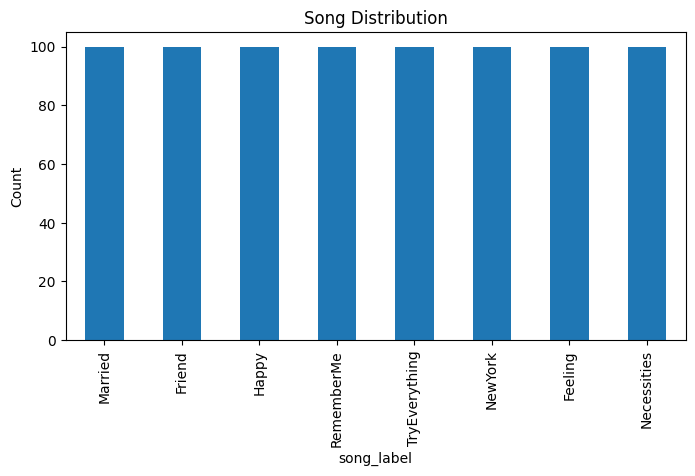

In [ ]:
df_items["song_label"].value_counts().plot(kind="bar", figsize=(8,4), title="Song Distribution")
plt.ylabel("Count")
plt.show()


In [ ]:
# Count samples per song
song_counts = df_items["song_label"].value_counts()
song_counts


,count
song_label,
Married,100
Friend,100
Happy,100
RememberMe,100
TryEverything,100
NewYork,100
Feeling,100
Necessities,100


Each of the eight song labels contains exactly 100 recordings, forming a perfectly
balanced multiclass classification problem. This uniformity means that overall accuracy
remains an appropriate metric during model evaluation, as performance is not dominated
by any majority class.


**Interpretation type distribution**

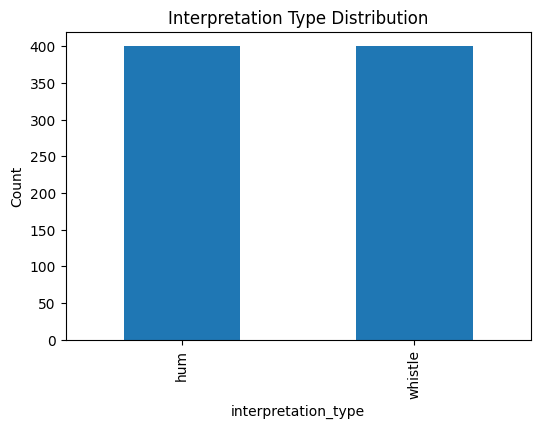

In [ ]:
df_items["interpretation_type"].value_counts().plot(kind="bar", figsize=(6,4), title="Interpretation Type Distribution")
plt.ylabel("Count")
plt.show()


In [ ]:
df_items["interpretation_type"].value_counts()


,count
interpretation_type,
hum,400
whistle,400


The dataset contains an equal number of humming and whistling recordings (400 each).
This balance ensures that the model is not biased toward a particular vocalisation style,
and it encourages the classifier to learn song-specific characteristics rather than
detecting whether a sample is a hum or a whistle.

**Participants distribution**

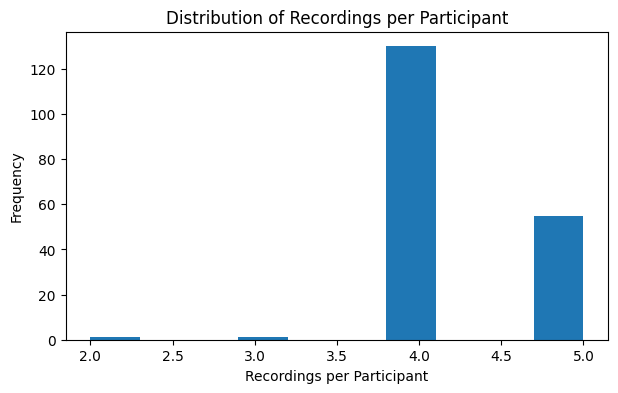

In [ ]:
df_items["interpreter_id"].value_counts().plot(kind="hist", bins=10, figsize=(7,4),
                                      title="Distribution of Recordings per Participant")
plt.xlabel("Recordings per Participant")
plt.show()


In [ ]:
df_items["interpreter_id"].value_counts()


,count
interpreter_id,
S109,5
S10,5
S106,5
S118,5
S115,5
...,...
S93,4
S9,4
S98,4


The interpreter distribution shows 187 unique participants, with most contributing
four or five recordings, confirming that the dataset does not suffer from extreme imbalance in participant contribution. This diversity in vocal style and recording habits increases
the variability that the model must generalise over, making strict group-aware splitting
(Section 5.8) essential.


**Dataset Summary**

The table below summarises the main characteristics of the dataset, including the
number of samples, class distribution, and number of participants. These statistics
provide an initial understanding of dataset size and balance before feature extraction.


In [ ]:
{
    "Total samples": len(df_items),
    "Song classes": df_items['song_label'].nunique(),
    "Hum recordings": (df_items['interpretation_type'] == 'hum').sum(),
    "Whistle recordings": (df_items['interpretation_type'] == 'whistle').sum(),
    "Participants": df_items['interpreter_id'].nunique()
}


{'Total samples': 800,
 'Song classes': 8,
 'Hum recordings': np.int64(400),
 'Whistle recordings': np.int64(400),
 'Participants': 187}

**Listening to a Few Random Samples**

To gain an intuitive understanding of the dataset, I listen to a small selection of randomly chosen audio recordings. Hearing the raw clips helps reveal differences in loudness, background noise, and humming or whistling style.


In [ ]:
# Play 3 random audio samples
for _ in range(3):
  idx = np.random.randint(0, len(df_items))
  file_path = df_items.iloc[idx]["file_path"]

  print(f"Sample {idx}: {df_items.iloc[idx]['song_label']} "
        f"({df_items.iloc[idx]['interpretation_type']})")

  display(ipd.Audio(file_path))

Sample 286: RememberMe (whistle)


Sample 162: Happy (whistle)


Sample 17: NewYork (hum)


The three examples above show substantial variation in duration, loudness, articulation style, and background noise. Some recordings are short and tightly produced, while others are longer with pauses or inconsistent volume. This variability motivates the need for duration normalisation and consistent preprocessing before extracting numerical features for machine-learning models.


**Visualising Example Audio Waveforms**

To supplement the audio playback, I visualise the waveform of a couple randomly selected recordings. These plots reveal how the signal evolves over time and highlight structural differences between humming and whistling interpretations. Inspecting the waveform also helps confirm that the recordings vary widely in energy, timing, and expressiveness, reinforcing the necessity of a standardised preprocessing pipeline.


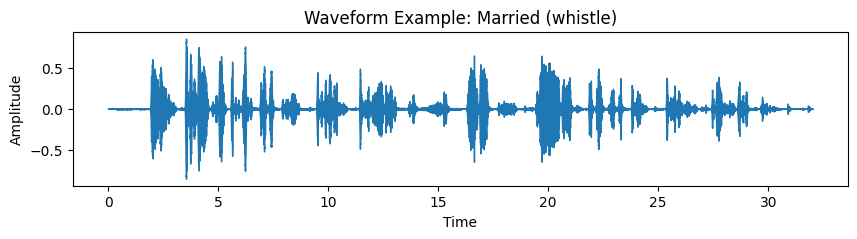

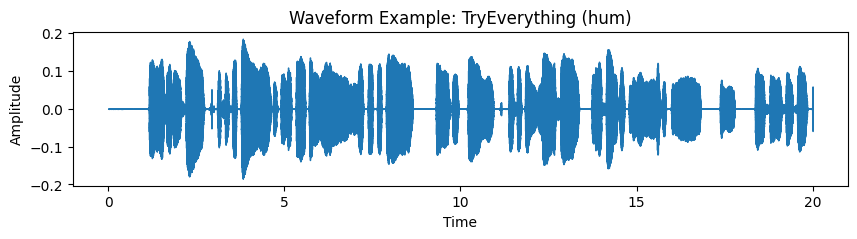

In [ ]:
# Display two random waveform examples
for _ in range(2):
    idx = np.random.randint(0, len(df_items) - 1)
    file_path = df_items.iloc[idx]["file_path"]

    x, sr = librosa.load(file_path, sr=None)

    plt.figure(figsize=(10, 2))
    librosa.display.waveshow(x, sr=sr)
    plt.title(f"Waveform Example: {df_items.iloc[idx]['song_label']} "
              f"({df_items.iloc[idx]['interpretation_type']})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.show()

The waveform plots illustrate clear differences in amplitude, rhythm, and articulation across recordings. Some examples contain strong periodic patterns, while others show irregular phrasing or long silent gaps. These observations underline the importance of transforming all recordings into a consistent temporal format before extracting MFCC, spectral, pitch, and energy-based features in Section 5.6.


**5.5 Audio loading and duration normalisation**

Machine-learning models require every input to have a fixed and consistent format. In this project, all audio clips are therefore transformed into 10-second, 16 kHz mono signals (160,000 samples). Standardising both sampling rate and duration ensures that every recording has an identical temporal structure before feature extraction.

A 16 kHz sampling rate is appropriate for humming and whistling because all meaningful acoustic energy lies below 8 kHz. This rate captures the full usable frequency range without introducing unnecessary high-frequency noise, and it reduces computational cost compared with 22 kHz or 44.1 kHz signals. Most classical audio features (e.g., MFCCs, spectral descriptors, pitch estimation) are also designed around 16 kHz audio, making this a natural choice for the task.

After loading the waveform, each clip is transformed as follows:

1. If the signal is longer than 10 seconds, it is truncated to 160,000 samples.  
2. If it is shorter, it is zero-padded at the end.  
3. All audio is converted to mono to ensure a consistent representation.

This normalisation step guarantees that all recordings share the same temporal length, allowing MFCC, spectral, pitch, and energy features to be computed consistently in later stages.


Example clip: S100_hum_2_Married.wav
Shape: (160000,), sr=16000


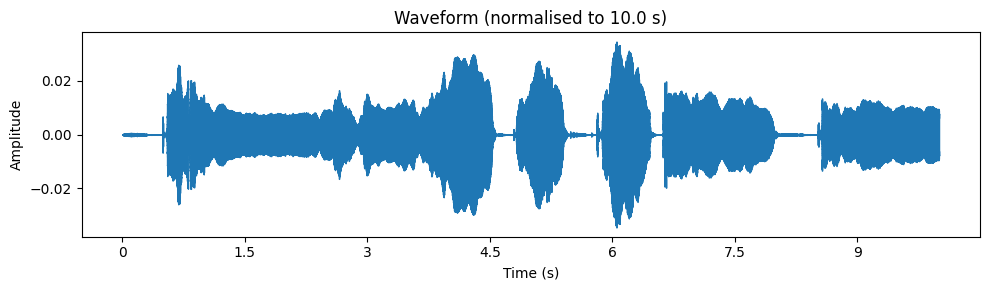

In [ ]:
# 5.5 Helper: load and normalise audio duration

def load_and_normalise_audio(path, target_sr=TARGET_SR, target_samples=TARGET_SAMPLES):
    # Load audio as mono and resample
    x, sr = librosa.load(path, sr=target_sr, mono=True)

    # Prevent clipping if waveform amplitude exceeds [-1, 1]
    max_amp = np.max(np.abs(x))
    if max_amp > 1.0:
        x = x / max_amp

    # Pad or truncate to the target number of samples
    n = x.shape[0]
    if n > target_samples:
        x = x[:target_samples]
    elif n < target_samples:
        pad_width = target_samples - n
        x = np.pad(x, (0, pad_width), mode="constant")

    return x, target_sr


# Example: visualise one normalised waveform
example_path = df_items.iloc[0]["file_path"]
x_example, sr_example = load_and_normalise_audio(example_path)

print(f"Example clip: {os.path.basename(example_path)}")
print(f"Shape: {x_example.shape}, sr={sr_example}")

plt.figure(figsize=(10, 3))
librosa.display.waveshow(x_example, sr=sr_example)
plt.title(f"Waveform (normalised to {TARGET_DURATION} s)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()


The plot above shows the waveform after applying duration normalisation. The clip has been resampled to 16 kHz and adjusted to exactly 10 seconds (160,000 samples). This confirms that the preprocessing stage produces a consistent temporal structure for all recordings.

Several characteristics can be observed:

- Energy levels vary over time, with alternating segments of activity and silence.  
- Amplitude remains low, as expected for humming and whistling recordings.  
- Repeated melodic patterns appear as similar oscillation shapes across the clip.  
- Short silent pauses reflect natural breathing or articulation.

This visual check verifies that normalisation has been applied correctly and highlights why a fixed-length representation is essential. Consistent duration simplifies feature extraction and ensures that MFCC, spectral, pitch, and energy features are computed on comparable time spans for all audio clips, improving the robustness and reproducibility of the full classification pipeline.


**5.6 Feature extraction: MFCC, spectral, pitch, and energy features**

To train classical machine-learning models, each audio clip must be represented as a fixed-length numerical feature vector. In this subsection, I design a hand-crafted feature extractor that summarises each 10-second signal using four complementary families of audio descriptors:

- **MFCC statistics (timbre / spectral envelope):**  
  Thirteen Mel-frequency cepstral coefficients are computed frame-wise and summarised using their mean and standard deviation. These capture broad spectral-shape characteristics of humming and whistling.

- **Spectral shape features:**  
  Global descriptors such as spectral centroid, bandwidth, roll-off, spectral contrast, and zero-crossing rate characterise frequency content, brightness, noisiness, and other timbral properties that vary across recordings and participants.

- **Pitch-based features:**  
  A frame-wise fundamental-frequency estimate (via `librosa.pyin`) provides statistics of the pitch contour, including pitch mean, variability, range, proportion of voiced frames, and the number of large pitch jumps. These reflect melodic structure and humming style.

- **Energy and temporal features:**  
  RMS energy statistics, overall signal power, temporal centroid, and attack time describe loudness, dynamics, and how energy is distributed over the recording.

The function `extract_features_from_waveform` below implements this feature set for a normalised waveform, returning a compact fixed-length vector (and optionally the associated feature names). This function will be reused in Section 5.7 to construct the full feature matrix for all 800 recordings.


In [ ]:
# 5.6 Feature extraction: MFCC, spectral, pitch and energy features
def extract_features_from_waveform(x, sr, return_feature_names=False):
    """
    Given a 1D waveform x at sampling rate sr, compute a fixed-length
    feature vector combining MFCC statistics, spectral shape features,
    pitch-based features, and energy/temporal features.

    If return_feature_names is True, also return a list of feature names
    in the same order as the feature values.
    """
    features = []
    names = []

    # Common STFT parameters
    n_fft = 2048
    hop_length = 512

    # 1) MFCC statistics
    mfcc = librosa.feature.mfcc(
        y=x,
        sr=sr,
        n_mfcc=13,
        n_fft=n_fft,
        hop_length=hop_length,
    )  # shape: (13, T)

    for i in range(mfcc.shape[0]):
        coeff = mfcc[i]
        coeff_mean = float(coeff.mean())
        coeff_std = float(coeff.std())
        features.extend([coeff_mean, coeff_std])
        names.extend(
            [
                f"mfcc_{i+1:02d}_mean",
                f"mfcc_{i+1:02d}_std",
            ]
        )

    # 2) Spectral shape features
    spec_centroid = librosa.feature.spectral_centroid(
        y=x, sr=sr, n_fft=n_fft, hop_length=hop_length
    )[0]
    spec_bandwidth = librosa.feature.spectral_bandwidth(
        y=x, sr=sr, n_fft=n_fft, hop_length=hop_length
    )[0]
    spec_rolloff = librosa.feature.spectral_rolloff(
        y=x, sr=sr, roll_percent=0.85, n_fft=n_fft, hop_length=hop_length
    )[0]
    spec_contrast = librosa.feature.spectral_contrast(
        y=x, sr=sr, n_fft=n_fft, hop_length=hop_length
    )

    # Means / stds
    features.extend(
        [
            float(spec_centroid.mean()),
            float(spec_centroid.std()),
            float(spec_bandwidth.mean()),
            float(spec_bandwidth.std()),
            float(spec_rolloff.mean()),
            float(spec_rolloff.std()),
        ]
    )
    names.extend(
        [
            "spec_centroid_mean",
            "spec_centroid_std",
            "spec_bandwidth_mean",
            "spec_bandwidth_std",
            "spec_rolloff_mean",
            "spec_rolloff_std",
        ]
    )

    # Spectral contrast: average over time for each band
    contrast_mean = spec_contrast.mean(axis=1)  # shape (n_bands,)
    for i, c in enumerate(contrast_mean, start=1):
        features.append(float(c))
        names.append(f"spec_contrast_band{i}_mean")

    # Zero-crossing rate (mean)
    zcr = librosa.feature.zero_crossing_rate(y=x, hop_length=hop_length)[0]
    features.append(float(zcr.mean()))
    names.append("zcr_mean")

    # 3) Pitch-based features
    # Use pyin to estimate fundamental frequency over time
    fmin = librosa.note_to_hz("C2")  # ~65 Hz
    fmax = librosa.note_to_hz("C7")  # ~2093 Hz

    try:
        f0, _, _ = librosa.pyin(
            x,
            fmin=fmin,
            fmax=fmax,
            sr=sr,
            frame_length=n_fft,
            hop_length=hop_length,
        )
    except Exception:
        f0 = None

    if f0 is not None:
        voiced_mask = ~np.isnan(f0)
        voiced_f0 = f0[voiced_mask]

        if voiced_f0.size > 0:
            pitch_mean = float(voiced_f0.mean())
            pitch_std = float(voiced_f0.std())
            pitch_range = float(voiced_f0.max() - voiced_f0.min())

            # Large pitch jumps between consecutive voiced frames
            pitch_diff = np.diff(voiced_f0)
            pitch_jumps = float((np.abs(pitch_diff) > 30.0).sum())

            voiced_fraction = float(voiced_f0.size / f0.size)
        else:
            pitch_mean = pitch_std = pitch_range = pitch_jumps = voiced_fraction = 0.0
    else:
        pitch_mean = pitch_std = pitch_range = pitch_jumps = voiced_fraction = 0.0

    features.extend(
        [pitch_mean, pitch_std, pitch_range, voiced_fraction, pitch_jumps]
    )
    names.extend(
        [
            "pitch_mean",
            "pitch_std",
            "pitch_range",
            "voiced_fraction",
            "pitch_jumps",
        ]
    )

    # 4) Energy and temporal features
    rms = librosa.feature.rms(
        y=x, frame_length=n_fft, hop_length=hop_length
    )[0]  # shape (T_frames,)
    rms_mean = float(rms.mean())
    rms_std = float(rms.std())

    signal_power = float(np.mean(x ** 2))

    # Temporal centroid and attack time based on frame energy
    frame_energy = rms ** 2
    times = librosa.times_like(rms, sr=sr, hop_length=hop_length)

    if frame_energy.sum() > 0:
        temporal_centroid = float(
            np.sum(times * frame_energy) / np.sum(frame_energy)
        )

        cumulative_energy = np.cumsum(frame_energy)
        cumulative_energy /= cumulative_energy[-1]
        idx_90 = np.searchsorted(cumulative_energy, 0.9)
        idx_90 = min(idx_90, len(times) - 1)
        attack_time_90 = float(times[idx_90])
    else:
        temporal_centroid = 0.0
        attack_time_90 = 0.0

    features.extend(
        [rms_mean, rms_std, signal_power, temporal_centroid, attack_time_90]
    )
    names.extend(
        [
            "rms_mean",
            "rms_std",
            "signal_power",
            "temporal_centroid",
            "attack_time_90",
        ]
    )

    # Final packing
    feature_array = np.asarray(features, dtype=np.float32)

    if return_feature_names:
        return feature_array, names
    else:
        return feature_array


# Example: extract features + feature names for one clip
example_path = df_items.iloc[0]["file_path"]  # string path
x_example, sr_example = load_and_normalise_audio(example_path)

example_features, FEATURE_NAMES = extract_features_from_waveform(
    x_example, sr_example, return_feature_names=True
)

print(f"Example file: {os.path.basename(example_path)}")
print(f"Sampling rate: {sr_example} Hz")
print(f"Number of features: {len(FEATURE_NAMES)}")

# Display the first few features in a table for inspection
display(
    pd.DataFrame(
        example_features.reshape(1, -1),
        columns=FEATURE_NAMES,
    ).T.head(15)
)

# inspect the full feature-name list
print("\nTotal number of features:", len(FEATURE_NAMES))
print("Feature names:")
for name in FEATURE_NAMES:
    print(" -", name)


Example file: S100_hum_2_Married.wav
Sampling rate: 16000 Hz
Number of features: 50


,0
mfcc_01_mean,-585.472534
mfcc_01_std,67.171982
mfcc_02_mean,79.009079
mfcc_02_std,25.037163
mfcc_03_mean,-5.085889
mfcc_03_std,16.186779
mfcc_04_mean,0.793102
mfcc_04_std,16.258102
mfcc_05_mean,1.369064
mfcc_05_std,14.635967



Total number of features: 50
Feature Names:
 - mfcc_01_mean
 - mfcc_01_std
 - mfcc_02_mean
 - mfcc_02_std
 - mfcc_03_mean
 - mfcc_03_std
 - mfcc_04_mean
 - mfcc_04_std
 - mfcc_05_mean
 - mfcc_05_std
 - mfcc_06_mean
 - mfcc_06_std
 - mfcc_07_mean
 - mfcc_07_std
 - mfcc_08_mean
 - mfcc_08_std
 - mfcc_09_mean
 - mfcc_09_std
 - mfcc_10_mean
 - mfcc_10_std
 - mfcc_11_mean
 - mfcc_11_std
 - mfcc_12_mean
 - mfcc_12_std
 - mfcc_13_mean
 - mfcc_13_std
 - spec_centroid_mean
 - spec_centroid_std
 - spec_bandwidth_mean
 - spec_bandwidth_std
 - spec_rolloff_mean
 - spec_rolloff_std
 - spec_contrast_band1_mean
 - spec_contrast_band2_mean
 - spec_contrast_band3_mean
 - spec_contrast_band4_mean
 - spec_contrast_band5_mean
 - spec_contrast_band6_mean
 - spec_contrast_band7_mean
 - zcr_mean
 - pitch_mean
 - pitch_std
 - pitch_range
 - voiced_fraction
 - pitch_jumps
 - rms_mean
 - rms_std
 - signal_power
 - temporal_centroid
 - attack_time_90


The example above shows the 50-dimensional feature vector extracted from a single normalised recording (`S100_hum_2_Married.wav`). As expected, the MFCC means and standard deviations appear first, followed by spectral, pitch, and energy descriptors. The output confirms that the feature extractor is producing a consistent, structured representation for each clip.

This verification step ensures that the feature pipeline behaves as intended and that all recordings are mapped to a uniform, fixed-size representation suitable for classical machine-learning models. The resulting dimensionality is small enough for linear models (Logistic Regression, Linear SVM), yet rich enough to support more flexible non-linear models such as RBF SVMs, tree ensembles, and the MLP explored in Section 6.

In the next subsection, I apply this function to the entire dataset to construct the full feature matrix **X** and corresponding label vector **y**.



**5.7 Building the full feature matrix `X` and label vector `y`**

Once the feature extractor has been defined, the next step is to apply it to every recording in the dataset and construct the arrays that will be used by the classifiers. In this subsection I build:

- **Feature matrix (`X_all`)**, where each row corresponds to one 10-second audio clip and each column to one of the 50 hand-crafted features defined in Section 5.6,

- **Label vector (`y_all`)**, where each entry encodes the song label as an integer in the range 0–7, and

- **Group vector (`groups_all`)** a group vector groups_all containing the interpreter ID for each item, which will be used in Section 5.8 to create group-aware train/validation/test splits.

The song labels are first converted from strings to integer indices using a `LabelEncoder`, and the original class names are stored so that predictions can later be mapped back to song titles in Section 6. For each row in `df_items`, the corresponding waveform is loaded and normalised, its feature vector is computed, and the features and interpreter ID are appended to lists. After iterating through all 800 recordings, these lists are stacked into NumPy arrays, yielding the final dataset representation (`X_all`, `y_all`, `groups_all`) that is reused throughout Section 6.




In [ ]:
# 5.7 Building the full feature matrix X and label / group vectors

# Encode song labels as integers 0..7
label_encoder = LabelEncoder()
y_all = label_encoder.fit_transform(df_items["song_label"].values)
df_items["song_label_idx"] = y_all  # keep for reference

# Save original class names for later decoding in Section 6
class_names = label_encoder.classes_
print("Class names:", class_names)

# Prepare containers for features and group IDs
all_features = []
groups_all = df_items["interpreter_id"].tolist()

print("Extracting features for all items...")
for file_path in tqdm(df_items["file_path"].values, total=len(df_items)):
    # Load and normalise waveform
    x, sr = load_and_normalise_audio(file_path)
    # Extract fixed-length feature vector
    feats = extract_features_from_waveform(x, sr)
    all_features.append(feats)

# Stack lists into NumPy arrays
X_all = np.vstack(all_features).astype(np.float32)
y_all = np.asarray(y_all, dtype=np.int64)
groups_all = np.asarray(groups_all)

print("Feature matrix shape X_all:", X_all.shape)
print("Label vector shape y_all:", y_all.shape)
print("Number of unique interpreters (groups):", np.unique(groups_all).shape[0])

# Additional sanity checks
assert X_all.shape[0] == len(y_all) == len(groups_all)
assert X_all.shape[1] == len(FEATURE_NAMES)
print("Sanity checks passed: Feature matrix and labels are consistent.")


Class names: ['Feeling' 'Friend' 'Happy' 'Married' 'Necessities' 'NewYork' 'RememberMe'
 'TryEverything']
Extracting features for all items...


100%|██████████| 800/800 [43:47<00:00,  3.28s/it]

Feature matrix shape X_all: (800, 50)
Label vector shape y_all: (800,)
Number of unique interpreters (groups): 187
Sanity checks passed: Feature matrix and labels are consistent.


The progress bar confirms that features have been successfully extracted for all 800 recordings. The resulting **feature matrix has shape 800×50**, meaning that each audio clip is represented by a 50-dimensional feature vector. The **label vector has length 800**, with each element corresponding to the encoded song label for that recording. The **group vector contains 187 unique interpreter IDs**, consistent with the dataset exploration in Section 5.4.

This step completes the transformation from raw audio into a structured numerical dataset. In Section 5.8, the group vector will be used to construct group-aware training, validation, and test splits that prevent recordings from the same participant appearing in multiple subsets. In Section 5.9, the feature matrix will be scaled to ensure that all models in Section 6 operate on standardised inputs.

**5.8 Train/validation/test splits (group-aware)**

A core methodological requirement of this project is that recordings from the same participant must not appear in more than one of the training, validation, or test sets. Without this constraint, a model could learn participant-specific vocal traits (such as pitch habits, loudness patterns, or articulation style) rather than the song-specific characteristics relevant to the prediction task. This would cause data leakage and artificially optimistic performance estimates.

To prevent this, I use a **group-aware splitting strategy** based on the interpreter ID. Each interpreter forms a group, and groups are kept intact when constructing all splits.

The splitting procedure uses `GroupShuffleSplit` in two stages:

- **Outer split (80% train+validation, 20% test)**  
  This first split creates a dedicated held-out test set. The test data remain untouched until the final evaluation in Section 6.9, providing an unbiased estimate of deployment-quality generalisation.

- **Inner split (75% training, 25% validation of the train+val pool)**  
  The training+validation portion is further divided into training and validation sets, again grouped by interpreter ID.  
  The validation set is used exclusively for model comparison and hyperparameter tuning in Section 6.

Additional defensive checks are included:

- Verifies that **no interpreter ID appears in more than one split**  
- Prints the sizes of the training, validation, and test sets  
- Displays **class distributions** in each split to confirm that label balance is preserved despite grouping constraints

These checks ensure that the resulting partitions form a sound methodological foundation for the modelling stage in Section 6. The splits enforce strict speaker independence, meaning that evaluation metrics reflect true generalisation to unseen participants rather than memorisation of speaker-specific vocal traits.

In [ ]:
# 5.8 Group-aware train/validation/test split (best of both versions)

# Use the full feature/label arrays built in 5.7
X = X_all
y = y_all
groups = groups_all.astype(object).copy()   # interpreter_id for each item

# handle missing interpreter IDs defensively
mask_missing = pd.isna(groups)
if mask_missing.any():
    # Assign a unique pseudo-group to each missing interpreter_id
    groups[mask_missing] = [f"anon_{i}" for i in np.where(mask_missing)[0]]

groups = np.array(groups)

print("Example groups:", groups[:10])

# Outer split: train+val vs test ( 80% / 20%)
gss_outer = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
trainval_idx, test_idx = next(gss_outer.split(X, y, groups=groups))

X_trainval, X_test = X[trainval_idx], X[test_idx]
y_trainval, y_test = y[trainval_idx], y[test_idx]
groups_trainval = groups[trainval_idx]
groups_test = groups[test_idx]

print("Train+Val size:", X_trainval.shape[0])
print("Test size:     ", X_test.shape[0])

# Inner split: train vs validation ( 75% / 25% of train+val)
gss_inner = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=123)
train_idx, val_idx = next(
    gss_inner.split(X_trainval, y_trainval, groups=groups_trainval)
)

X_train, X_val = X_trainval[train_idx], X_trainval[val_idx]
y_train, y_val = y_trainval[train_idx], y_trainval[val_idx]
groups_train = groups_trainval[train_idx]
groups_val = groups_trainval[val_idx]

print("Train size:     ", X_train.shape[0])
print("Validation size:", X_val.shape[0])

# Sanity check: no interpreter appears in multiple splits
set_train = set(groups_train)
set_val = set(groups_val)
set_test = set(groups_test)

print("\nInterpreter overlap between splits:")
print("  Train - Val :", len(set_train.intersection(set_val)))
print("  Train - Test:", len(set_train.intersection(set_test)))
print("  Val - Test:", len(set_val.intersection(set_test)))

# Helper to inspect class distributions
song_classes = label_encoder.classes_  # from 5.7

def print_class_distribution(labels, split_name):
    counts = pd.Series(labels).value_counts().sort_index()
    rel = counts / counts.sum()
    print(f"\nClass distribution in {split_name}:")
    for c, r in zip(counts.index, rel):
        song = song_classes[c]
        print(f"  Class {c} ({song:>12}): count={int(counts[c]):3d}, rel={r:.3f}")

print_class_distribution(y_train, "train")
print_class_distribution(y_val, "validation")
print_class_distribution(y_test, "test")

Example groups: ['S100' 'S100' 'S100' 'S100' 'S101' 'S101' 'S101' 'S101' 'S102' 'S102']
Train+Val size: 638
Test size:      162
Train size:      473
Validation size: 165

Interpreter overlap between splits:
  Train - Val : 0
  Train - Test: 0
  Val - Test: 0

Class distribution in train:
  Class 0 (     Feeling): count= 57, rel=0.121
  Class 1 (      Friend): count= 64, rel=0.135
  Class 2 (       Happy): count= 64, rel=0.135
  Class 3 (     Married): count= 56, rel=0.118
  Class 4 ( Necessities): count= 53, rel=0.112
  Class 5 (     NewYork): count= 57, rel=0.121
  Class 6 (  RememberMe): count= 62, rel=0.131
  Class 7 (TryEverything): count= 60, rel=0.127

Class distribution in validation:
  Class 0 (     Feeling): count= 21, rel=0.127
  Class 1 (      Friend): count= 18, rel=0.109
  Class 2 (       Happy): count= 17, rel=0.103
  Class 3 (     Married): count= 22, rel=0.133
  Class 4 ( Necessities): count= 24, rel=0.145
  Class 5 (     NewYork): count= 21, rel=0.127
  Class 6 (  Reme

The output of the group-aware splitting procedure confirms that:

- The combined training+validation pool contains **638 recordings**  
- The inner split yields **473 training** items and **165 validation** items  
- The held-out test set contains **162 recordings**  
- There is **0 interpreter overlap** across training, validation, and test sets  
- Class distributions in all three subsets remain close to uniform (roughly 12.5% per class)

These results demonstrate that the data partitioning is methodologically correct, preserves class balance, and provides a reliable basis for selecting and evaluating models under strict speaker-independent conditions.

**5.9 Feature scaling**

Before training the machine-learning models, it is important to ensure that all features operate on a comparable numerical scale. Many algorithms, such as logistic regression, SVMs, k-NN, and multilayer perceptrons, are sensitive to differences in feature magnitude. Features with larger numeric ranges can dominate distance computations or gradient updates, leading to unstable optimisation and suboptimal performance.

To address this, I apply a standardisation step using `StandardScaler`, which subtracts the mean and divides by the standard deviation of each feature. Crucially, the scaler is fitted **only on the training set**, and the same transformation is then applied to the validation and test sets. This prevents any information from the validation or test data leaking into the training parameters, preserving correct methodology.

The code below fits the scaler on `X_train`, transforms all three splits, and prints a short sanity check showing that the scaled training data has approximately zero mean and unit variance.



In [ ]:
# 5.9 Standardise features based on the training set

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# retain scaler for model training in Section 6
saved_scaler = scaler

X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

print("Train mean after scaling (should be around 0):", X_train_scaled.mean(axis=0)[:5])
print("Train std after scaling (should be around 1):", X_train_scaled.std(axis=0)[:5])


Train mean after scaling (should be around 0): [-4.8641422e-08  7.4348288e-09  2.6147916e-08  2.4698753e-08
  1.7515953e-08]
Train std after scaling (should be around 1): [1.0000001  1.0000001  1.         0.9999998  0.99999976]


The output confirms that the standardisation has been applied correctly. The first few feature means in the scaled training set are very close to zero, and the corresponding standard deviations are very close to one, exactly as expected from a correctly fitted `StandardScaler`. Small deviations from exactly 0 and 1 arise from floating-point precision and are entirely normal.

Standardising the features ensures that all models used in Section 6 receive inputs on a consistent scale. This prevents features with larger numeric ranges from dominating the learning process. This step is particularly important for distance-based models such as k-NN and margin-based classifiers such as SVMs and logistic regression.

The same transformation is applied to the validation and test sets using the training-set parameters, preserving the integrity of the experimental setup.


**5.10 Sanity-check: feature distribution visualisation**

Before proceeding to model training, it is useful to perform a visual inspection of the extracted features to verify that they behave sensibly and exhibit meaningful variation across the dataset. This diagnostic step helps identify potential issues such as constant features, extreme outliers, or unexpected distribution shapes that may negatively affect downstream classifiers.

In this subsection, I visualise a small selection of representative features using histograms and boxplots. The first set of plots shows the marginal distributions of several raw features, including an MFCC mean, spectral centroid, pitch mean, and RMS energy. These examples illustrate the diversity of acoustic characteristics across the 800 recordings and help confirm that the feature extractor implemented in Section 5.6 is functioning correctly.

To explore how a specific feature varies across song classes, I also include a boxplot of one MFCC feature grouped by song label. Finally, I visualise a class-coloured histogram of the same MFCC feature on the **scaled** training set (from Section 5.9). This provides insight into whether individual features offer any discriminative power between songs, informing expectations about classifier behaviour in Section 6.

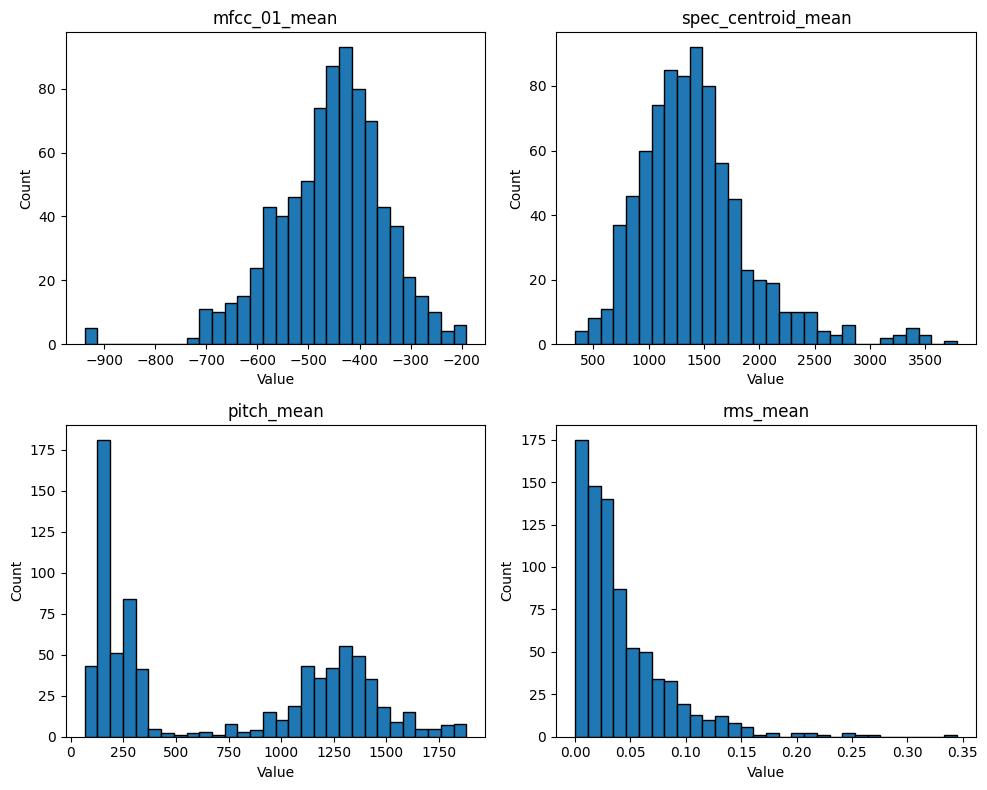

<Figure size 1000x500 with 0 Axes>

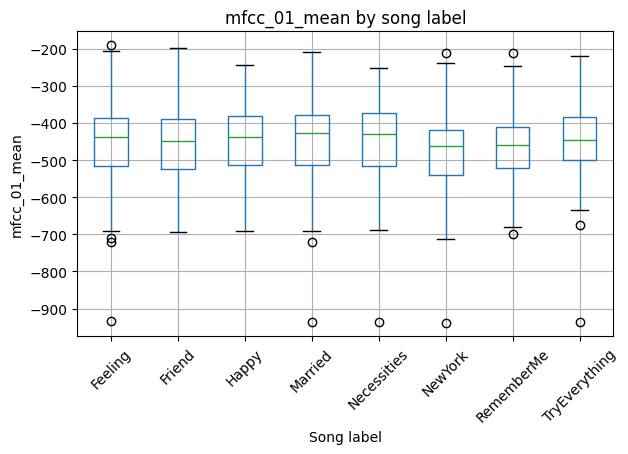

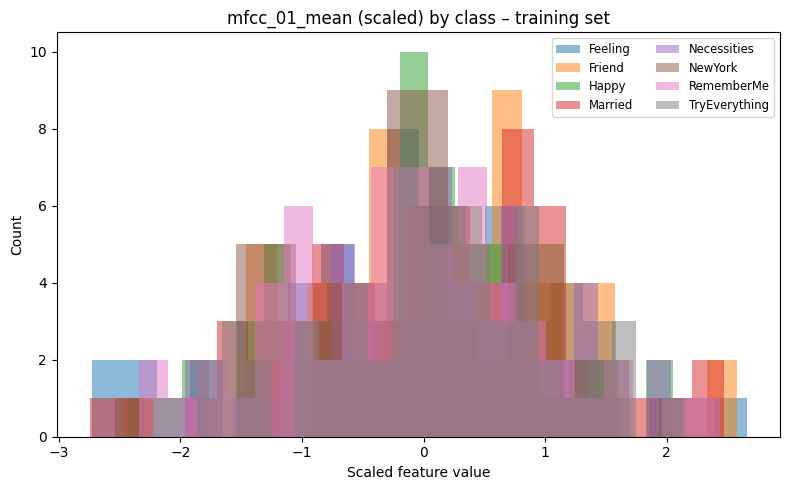

In [ ]:
# 5.10 Sanity-check: feature distribution visualisation

# Build a DataFrame of all features using the global FEATURE_NAMES list
df_features = pd.DataFrame(X_all, columns=FEATURE_NAMES)
df_features["song_label"] = df_items["song_label"].values

# Basic histograms for a few representative features

selected_features = [
    "mfcc_01_mean",
    "spec_centroid_mean",
    "pitch_mean",
    "rms_mean",
]

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.ravel()

for ax, feat in zip(axes, selected_features):
    ax.hist(df_features[feat], bins=30, edgecolor="black")
    ax.set_title(feat)
    ax.set_xlabel("Value")
    ax.set_ylabel("Count")

plt.tight_layout()
plt.show()

# Boxplot of one MFCC feature by song label

plt.figure(figsize=(10, 5))
df_features.boxplot(column="mfcc_01_mean", by="song_label", rot=45)
plt.title("mfcc_01_mean by song label")
plt.suptitle("")  # remove automatic Pandas super-title
plt.xlabel("Song label")
plt.ylabel("mfcc_01_mean")
plt.tight_layout()
plt.show()

# class-coloured histogram on the training set
# One feature chosen to inspect in more detail
feat_name = "mfcc_01_mean"
feat_idx = FEATURE_NAMES.index(feat_name)

feat_vals_train = X_train_scaled[:, feat_idx]

plt.figure(figsize=(8, 5))
for cls_idx, cls_name in enumerate(song_classes):
    mask = y_train == cls_idx
    plt.hist(
        feat_vals_train[mask],
        bins=20,
        alpha=0.5,
        label=cls_name,
    )

plt.title(f"{feat_name} (scaled) by class – training set")
plt.xlabel("Scaled feature value")
plt.ylabel("Count")
plt.legend(fontsize="small", ncol=2)
plt.tight_layout()
plt.show()


The histograms provide a clear view of how different feature families behave across the dataset. For example:

- MFCC and spectral-centroid features often display approximately Gaussian-shaped distributions.
- Pitch-mean and RMS-energy features show more skewed patterns that reflect natural variability in humming and whistling recordings.

These shapes match expectations for real audio signals and confirm that the feature extractor is capturing meaningful acoustic structure.

The boxplot of an MFCC feature across song labels shows overlapping but distinguishable distributions. Some classes exhibit slightly higher or lower central tendencies. Although no single feature cleanly separates all eight classes, the variability observed between classes suggests that the **full 50-dimensional feature set** contains useful discriminative structure.

The class-coloured histogram on the **standardised** training set further illustrates how the selected MFCC feature varies between classes after scaling. While the distributions still overlap substantially, there are visible shifts in mean and spread across songs, which is typical for MFCC-based representations. These visual checks help validate that scaling was performed correctly and that the features provide a reasonable basis for the classical models trained in Section 6.

### Overall Summary

In this section, I prepared the MLEnd Hums and Whistles II dataset for machine-learning experimentation by transforming the raw audio recordings into a structured, model-ready form. This involved loading and inspecting the dataset, normalising all waveforms to a fixed 10-second duration at 16 kHz, and implementing a hand-crafted feature extractor combining MFCC-, spectral-, pitch-, and energy-based descriptors. Applying this extractor to every recording produced a consistent 50-dimensional feature vector for each of the 800 audio clips.

I then constructed group-aware training, validation, and test sets using interpreter IDs to avoid data leakage and ensure that evaluation reflects generalisation to unseen speakers. A standardisation step, fitted strictly on the training set, placed all features on a comparable scale for the classical models used later. Visual diagnostics confirmed that the extracted features behave sensibly and that the resulting splits remain class-balanced and free from interpreter overlap.

These preparatory steps form the methodological foundation for the modelling pipelines in Section 6. Classical models such as logistic regression, SVMs, k-NN, tree-based methods, and MLPs require fixed-length, well-scaled feature vectors. By ensuring that every clip has the same duration, that features are numerically comparable, and that no participant appears in more than one subset, Section 5 establishes a principled framework for both model training and fair performance evaluation.

Despite these strengths, several dataset limitations must be considered. The recordings originate from 187 participants, introducing high variability in vocal quality, loudness, expressiveness, and background noise. Duration normalisation and feature scaling address part of this variability, but cannot eliminate differences such as microphone quality or individual humming and whistling styles. The dataset also contains only 100 samples per class, which constrains the complexity of models that can be trained reliably. Group-aware splitting further reduces the effective training size and requires models to generalise to entirely unseen speakers, an inherently challenging requirement for audio classification tasks.

These limitations shape the modelling strategies explored in Section 6. The models must extract meaningful structure from the 50-dimensional feature space, remain robust to inter-speaker variability, and operate effectively with limited training data. The experiments in Section 6 compare a range of classical models under these constraints, using the validation and test sets defined here to assess how well the learned classifiers generalise to new participants.


# 6 Experiments and results

*Carry out your experiments here. Analyse and explain your results. Unexplained results are worthless.*

---

## 6.1 Experimental Setup

Before evaluating different machine-learning pipelines, it is essential to define the experimental setup used consistently throughout Section 6. The goal of this section is not only to train models, but also to **analyse and explain their behaviour**, with a particular focus on their ability to **generalise** beyond the training data.

The experiments in this section rely on the group-aware dataset splits constructed in Section 5, as well as the engineered feature representations derived from each audio clip.

---

### **Datasets**

The experiments use the **group-aware train/validation/test splits** defined in Section 5:

- **Training set (`X_train_scaled`, `y_train`)**  
  Used to fit model parameters.

- **Validation set (`X_val_scaled`, `y_val`)**  
  Used to estimate generalisation performance and guide hyperparameter selection.

- **Test set (`X_test_scaled`, `y_test`)**  
  Held out entirely from model development. Evaluated **once** at the end using the best model identified during validation.

Because participants were separated using interpreter IDs, **no individual appears in more than one subset**, preventing data leakage and ensuring a fair evaluation of how models generalise to previously unseen people.

---

### **Evaluation Philosophy**

For every model configuration examined in Section 6, the following evaluation protocol is applied:

1. **Training and Validation Accuracy**  
   - The **training accuracy** quantifies how well the model fits the examples it has seen.  
   - The **validation accuracy** provides the essential estimate of deployment performance.

   Comparing these values enables diagnosis of:

   - **Underfitting:** low accuracy on both training and validation sets, indicating that the model is too simple.  
   - **Overfitting:** high training accuracy but substantially lower validation accuracy, indicating that the model has memorised noise instead of learning generalisable structure.

2. **Validation Confusion Matrix**  
   A confusion matrix is computed for each pipeline to analyse:

   - Which song classes are most often misclassified  
   - Whether errors are concentrated between acoustically similar songs  
   - Whether the classifier exhibits systematic bias toward particular labels  

   These insights are essential, as **unexplained results are methodologically invalid**.

3. **Misclassification Interpretation**  
   The confusion matrix is used to interpret the structure of errors, such as:

   - Confusion between songs with similar melodic contours  
   - Effects of humming vs. whistling variability  
   - Classes that are consistently easy or difficult to predict  

   This analysis justifies why certain model families perform better than others during model selection.

---

### **Model Selection Strategy**

After all experiments have been carried out, the following procedure is used to determine the final classifier:

1. **Select the best-performing configuration based on validation accuracy**  
   Hyperparameters and model families are compared using validation performance, not training accuracy.

2. **Retrain the model on the combined Training + Validation datasets**  
   This produces the strongest possible estimator before final evaluation.

3. **Evaluate the chosen model on the Test Set**  
   The test-set evaluation includes:

   - Overall accuracy  
   - Per-class precision, recall, and F1-score  
   - Test confusion matrix  

   These class-aware metrics quantify the model's strengths and weaknesses across the eight song labels and provide the final performance estimate for deployment.

---

### **Summary**

This structured experimental setup ensures that each result contributes meaningfully to understanding model generalisation and supports a principled, defensible model selection process. Section 6.2 begins with baseline classical pipelines, following the methodology outlined above.


In [ ]:
# 6.1 Experimental setup: import modelling tools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report

# Classical models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Dimensionality reduction
from sklearn.decomposition import PCA

# Neural network (MLP)
from sklearn.neural_network import MLPClassifier

# advanced models
import xgboost as xgb

# Utility: helper function to plot confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay

def plot_confusion(cm, classes, title):
    fig, ax = plt.subplots(figsize=(6, 5))  # a bit wider
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap="Blues", values_format="d", ax=ax, colorbar=False)

    # Rotate x-axis labels so they don’t overlap
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    ax.set_title(title)
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")

    plt.tight_layout()
    plt.show()


## 6.2 Baseline Classical Pipelines

In this subsection, I establish simple baseline classifiers that operate on the hand-crafted feature vectors prepared in Section 5. These models provide reference points against which more sophisticated pipelines in later subsections (SVMs, tree ensembles, MLPs, etc.) can be compared.

All baselines are trained and evaluated using the same inputs:

- Training data: `X_train_scaled`, `y_train`
- Validation data: `X_val_scaled`, `y_val`
- Class names: `class_names` (string labels for the eight songs)

For each baseline, I report:

- Training accuracy  
- Validation accuracy  
- Validation confusion matrix  

The numerical results and confusion matrices will be analysed in detail after the outputs are collected.


6.2.1 Majority-class baseline
Most frequent training class: index=1, label='Friend', count=64
Training accuracy (majority baseline):  0.1353
Validation accuracy (majority baseline): 0.1091


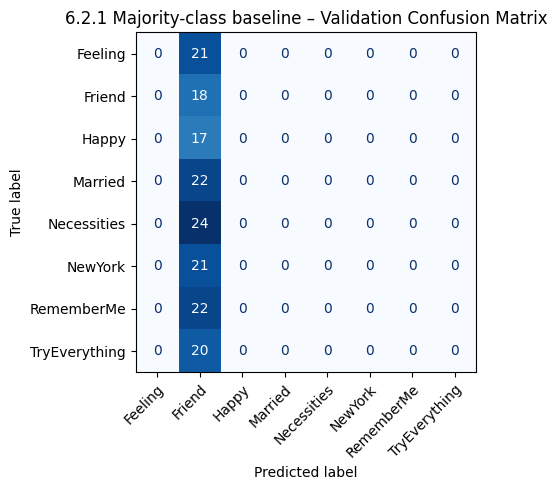


6.2.2 k-Nearest Neighbours (k-NN)
k= 1 | train_acc=1.0000 | val_acc=0.1758
k= 3 | train_acc=0.3594 | val_acc=0.1394
k= 5 | train_acc=0.3023 | val_acc=0.2000
k= 7 | train_acc=0.2770 | val_acc=0.1879
k= 9 | train_acc=0.2791 | val_acc=0.1939

Best k according to validation accuracy: k=5
Best k-NN training accuracy:  0.3023
Best k-NN validation accuracy: 0.2000


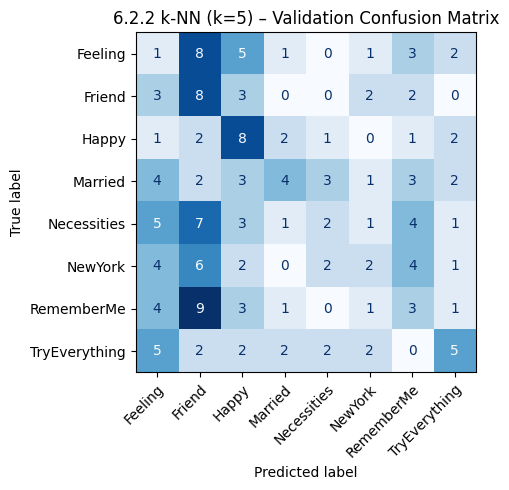


 6.2.3 Multinomial Logistic Regression
Training accuracy (LogReg):  0.4313
Validation accuracy (LogReg): 0.2485


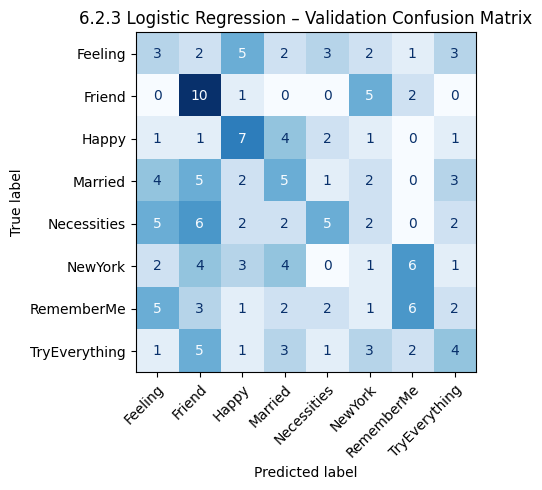

In [ ]:
# 6.2 Baseline Classical Pipelines

baseline_results = {}

# 6.2.1 Majority-class baseline

from collections import Counter

print("6.2.1 Majority-class baseline")

# Find the most frequent class in the training set
class_counts = Counter(y_train)
majority_class_idx, majority_count = class_counts.most_common(1)[0]
majority_class_name = class_names[majority_class_idx]

print(f"Most frequent training class: index={majority_class_idx}, label='{majority_class_name}', count={majority_count}")

# Predict the majority class for every example
y_train_pred_majority = np.full_like(y_train, fill_value=majority_class_idx)
y_val_pred_majority = np.full_like(y_val, fill_value=majority_class_idx)

train_acc_majority = accuracy_score(y_train, y_train_pred_majority)
val_acc_majority = accuracy_score(y_val, y_val_pred_majority)

print(f"Training accuracy (majority baseline):  {train_acc_majority:.4f}")
print(f"Validation accuracy (majority baseline): {val_acc_majority:.4f}")

cm_val_majority = confusion_matrix(y_val, y_val_pred_majority)

plot_confusion(
    cm_val_majority,
    classes=class_names,
    title="6.2.1 Majority-class baseline – Validation Confusion Matrix"
)

baseline_results["majority"] = {
    "train_acc": train_acc_majority,
    "val_acc": val_acc_majority,
    "cm_val": cm_val_majority,
}


# 6.2.2 k-Nearest Neighbours

print("\n6.2.2 k-Nearest Neighbours (k-NN)")

# Try a small set of k values
k_values = [1, 3, 5, 7, 9]
knn_results = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train)

    y_train_pred = knn.predict(X_train_scaled)
    y_val_pred = knn.predict(X_val_scaled)

    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)

    print(f"k={k:2d} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")

    knn_results.append((k, train_acc, val_acc))

# Select the k with the best validation accuracy
best_k, best_train_acc, best_val_acc = max(knn_results, key=lambda t: t[2])
print(f"\nBest k according to validation accuracy: k={best_k}")

# Refit k-NN with the best k to obtain confusion matrix
best_knn = KNeighborsClassifier(n_neighbors=best_k)
best_knn.fit(X_train_scaled, y_train)

y_val_pred_best_knn = best_knn.predict(X_val_scaled)
cm_val_knn = confusion_matrix(y_val, y_val_pred_best_knn)

print(f"Best k-NN training accuracy:  {best_train_acc:.4f}")
print(f"Best k-NN validation accuracy: {best_val_acc:.4f}")

plot_confusion(
    cm_val_knn,
    classes=class_names,
    title=f"6.2.2 k-NN (k={best_k}) – Validation Confusion Matrix"
)

baseline_results["knn"] = {
    "best_k": best_k,
    "train_acc": best_train_acc,
    "val_acc": best_val_acc,
    "cm_val": cm_val_knn,
}


# 6.2.3 Multinomial Logistic Regression

print("\n 6.2.3 Multinomial Logistic Regression")

log_reg = LogisticRegression(
    solver="lbfgs",
    max_iter=2000,
    n_jobs=-1,
    random_state=42,
)

log_reg.fit(X_train_scaled, y_train)

y_train_pred_lr = log_reg.predict(X_train_scaled)
y_val_pred_lr = log_reg.predict(X_val_scaled)

train_acc_lr = accuracy_score(y_train, y_train_pred_lr)
val_acc_lr = accuracy_score(y_val, y_val_pred_lr)

print(f"Training accuracy (LogReg):  {train_acc_lr:.4f}")
print(f"Validation accuracy (LogReg): {val_acc_lr:.4f}")

cm_val_lr = confusion_matrix(y_val, y_val_pred_lr)

plot_confusion(
    cm_val_lr,
    classes=class_names,
    title="6.2.3 Logistic Regression – Validation Confusion Matrix"
)

baseline_results["logreg"] = {
    "train_acc": train_acc_lr,
    "val_acc": val_acc_lr,
    "cm_val": cm_val_lr,
}


### 6.2 Evaluation and Interpretation

This subsection analyses the performance of the three baseline classical models:  
1) Majority-class classifier, 2) k-Nearest Neighbours (k-NN), and  
3) Multinomial Logistic Regression.  
For each model, I compare training and validation accuracy to diagnose underfitting or overfitting, and use the validation confusion matrix to interpret the pattern of misclassifications.

---

## **6.2.1 Majority-class Baseline**

**Training accuracy:** 0.1353  
**Validation accuracy:** 0.1091  

The majority-class classifier predicts the most frequent class (“Friend”) for every sample. Both training and validation accuracies are extremely low, reflecting the class-balanced nature of the dataset. The confusion matrix shows that *all* validation samples are mapped to the “Friend” class, producing:

- Perfect recall for “Friend” but zero recall for all other seven classes  
- No meaningful discrimination ability  

This baseline establishes a very low reference point. Any useful model must significantly outperform this level.

---

## **6.2.2 k-Nearest Neighbours (k-NN)**

**Best k:** 5  
**Training accuracy:** 0.3023  
**Validation accuracy:** 0.2000  

k-NN achieves better performance than the majority baseline but remains weak. The large gap between training accuracy (~ 0.30) and validation accuracy (~ 0.20) indicates **overfitting**:

- With high-dimensional features (50 dimensions), distance-based methods like k-NN often struggle, especially with limited samples per class.
- k-NN “memorises” the training set structure and fails to generalise to unseen interpreters.

**Confusion matrix interpretation:**

- Misclassifications are spread across almost all classes, with no class achieving strong recall.
- Several classes such as *Necessities*, *TryEverything*, and *Feeling* show substantial confusion with multiple other labels.
- This suggests the neighbourhood structure in the 50-dimensional feature space is not sufficiently discriminative for melody identification.

Overall, k-NN provides a better baseline than the trivial classifier, but its generalisation is poor due to feature sparsity and variability among interpreters.

---

## **6.2.3 Multinomial Logistic Regression**

**Training accuracy:** 0.4313  
**Validation accuracy:** 0.2485  

Logistic Regression outperforms both the majority baseline and k-NN. However, the training–validation accuracy gap again indicates **overfitting**:

- The model fits the linear decision boundaries reasonably well on the training set (~0.43 accuracy),
- But generalisation drops to ~0.25 on unseen participants.

This suggests that a linear classifier is too rigid to capture the complex non-linear relationships present in the feature space.

**Confusion matrix interpretation:**

- Errors remain widespread, but the matrix displays slightly clearer diagonal structure than k-NN.
- Some classes such as *Friend* and *NewYork* achieve moderate recall (e.g., 10 correct predictions for “Friend”).
- However, many classes (e.g., “Necessities”, “TryEverything”) show substantial confusion with acoustically similar songs, reflecting the limitations of linear boundaries.

Overall, logistic regression provides the strongest baseline so far, but is still unable to model the non-linear acoustic relationships in the feature space.

---

## **Summary of Baseline Behaviour**

| Model | Train Accuracy | Validation Accuracy | Observation |
|-------|----------------|---------------------|-------------|
| Majority-class | 0.1353 | 0.1091 | No discriminative power |
| k-NN (k=5) | 0.3023 | 0.2000 | Overfitting; poor generalisation |
| Logistic Regression | 0.4313 | 0.2485 | Best baseline; still underfits/overfits due to linearity |

These results indicate:

- Baseline models are **not expressive enough** to capture melody-related structure.  
- Validation performance remains low across all baselines, motivating the exploration of **non-linear** models such as SVMs, Random Forests, Gradient Boosted Trees, and neural networks.  
- The confusion matrices confirm that misclassifications are broadly distributed, consistent with the difficulty of separating eight songs based on humming and whistling alone.

The next subsection (6.3) investigates more powerful classical models, beginning with Support Vector Machines and Random Forests.



## 6.3 More Powerful Classical Pipelines

The baseline models in Section 6.2 demonstrated limited generalisation ability, with validation accuracies ranging from 0.10 to 0.25. This is expected, as these models rely on either simple heuristics (majority classifier), local neighbourhood structure (k-NN), or linear decision boundaries (Logistic Regression). Such models are often insufficient for tasks requiring separation of classes with complex acoustic and melodic characteristics.

In this subsection, I evaluate two more powerful classical model families:

### **1. Support Vector Machines (SVMs)**  
SVMs can model non-linear relationships through kernel functions.  
I evaluate:
- a **linear SVM**, to test whether a margin-based linear classifier improves over logistic regression, and  
- an **RBF-kernel SVM**, which introduces non-linear decision boundaries capable of capturing more complex feature interactions.

SVMs are known for strong performance on medium-sized datasets with engineered features, making them promising candidates for this task.

### **2. Random Forest Classifier**  
Random Forests are ensemble models based on aggregating multiple decision trees.  
They can:
- capture non-linear relationships,  
- perform implicit feature selection, and  
- exhibit robustness to noisy or redundant features.

They also provide a strong classical baseline before exploring more advanced models in later sections (PCA pipelines, MLPs, and creative models).

---

### **Evaluation Strategy**

For each model:
- I train on `X_train_scaled` and evaluate on both `X_train_scaled` and `X_val_scaled`.  
- I compute training and validation accuracy to diagnose underfitting or overfitting.  
- I display and later interpret the **validation confusion matrix**.  

As with the previous subsection, interpretation is deferred until results are gathered, because **unexplained results are methodologically invalid**. The results from this section will inform the model ranking and selection process in Section 6.7.


6.3.1 Linear SVM
Training accuracy (Linear SVM):  0.5539
Validation accuracy (Linear SVM): 0.2909


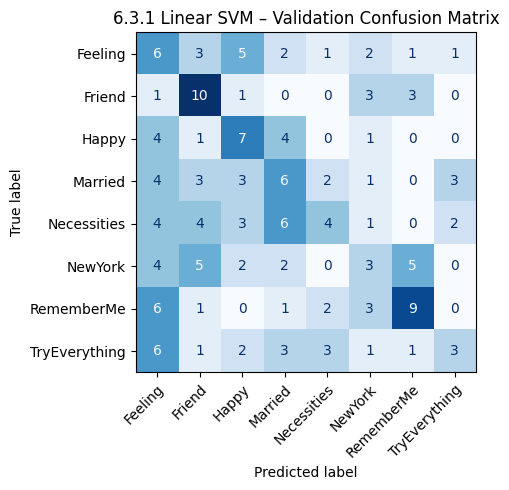


6.3.2 RBF SVM
C=0.1, gamma=scale | train_acc=0.2199 | val_acc=0.1697
C=0.1, gamma=0.01 | train_acc=0.2072 | val_acc=0.1697
C=0.1, gamma=0.1 | train_acc=0.2706 | val_acc=0.1212
C=1, gamma=scale | train_acc=0.5729 | val_acc=0.2182
C=1, gamma=0.01 | train_acc=0.4017 | val_acc=0.2121
C=1, gamma=0.1 | train_acc=1.0000 | val_acc=0.1576
C=10, gamma=scale | train_acc=0.9937 | val_acc=0.2364
C=10, gamma=0.01 | train_acc=0.8943 | val_acc=0.2303
C=10, gamma=0.1 | train_acc=1.0000 | val_acc=0.1879

Best RBF SVM: C=10, gamma=scale
Training accuracy (best RBF):  0.9937
Validation accuracy (best RBF): 0.2364


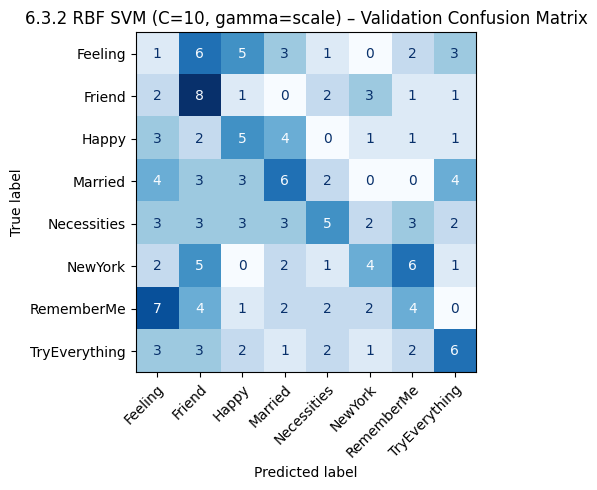


 6.3.3 Random Forest
Training accuracy (Random Forest):  1.0000
Validation accuracy (Random Forest): 0.2545


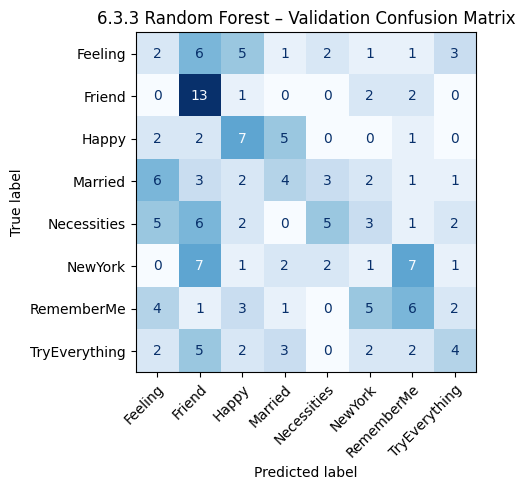

In [ ]:
# 6.3 More Powerful Classical Pipelines

svm_results = {}
rf_results = {}

# 6.3.1 Linear SVM

print("6.3.1 Linear SVM")

linear_svm = SVC(kernel="linear", C=1.0, random_state=42)
linear_svm.fit(X_train_scaled, y_train)

y_train_pred_linear = linear_svm.predict(X_train_scaled)
y_val_pred_linear = linear_svm.predict(X_val_scaled)

train_acc_linear = accuracy_score(y_train, y_train_pred_linear)
val_acc_linear = accuracy_score(y_val, y_val_pred_linear)

print(f"Training accuracy (Linear SVM):  {train_acc_linear:.4f}")
print(f"Validation accuracy (Linear SVM): {val_acc_linear:.4f}")

cm_val_linear = confusion_matrix(y_val, y_val_pred_linear)
plot_confusion(
    cm_val_linear,
    classes=class_names,
    title="6.3.1 Linear SVM – Validation Confusion Matrix"
)

svm_results["linear"] = {
    "train_acc": train_acc_linear,
    "val_acc": val_acc_linear,
    "cm_val": cm_val_linear,
}


# 6.3.2 RBF SVM (non-linear)

print("\n6.3.2 RBF SVM")

# Try a few combinations of C and gamma
C_values = [0.1, 1, 10]
gamma_values = ["scale", 0.01, 0.1]

rbf_trials = []

for C in C_values:
    for gamma in gamma_values:
        rbf_svm = SVC(kernel="rbf", C=C, gamma=gamma, random_state=42)
        rbf_svm.fit(X_train_scaled, y_train)

        y_train_pred = rbf_svm.predict(X_train_scaled)
        y_val_pred = rbf_svm.predict(X_val_scaled)

        train_acc = accuracy_score(y_train, y_train_pred)
        val_acc = accuracy_score(y_val, y_val_pred)

        print(f"C={C}, gamma={gamma} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")
        rbf_trials.append((C, gamma, train_acc, val_acc))

# Pick best RBF SVM by validation accuracy
best_C, best_gamma, best_train_acc, best_val_acc = max(rbf_trials, key=lambda t: t[3])

print(f"\nBest RBF SVM: C={best_C}, gamma={best_gamma}")
print(f"Training accuracy (best RBF):  {best_train_acc:.4f}")
print(f"Validation accuracy (best RBF): {best_val_acc:.4f}")

# Refit best model for confusion matrix
best_rbf_svm = SVC(kernel="rbf", C=best_C, gamma=best_gamma, random_state=42)
best_rbf_svm.fit(X_train_scaled, y_train)
y_val_pred_best_rbf = best_rbf_svm.predict(X_val_scaled)

cm_val_rbf = confusion_matrix(y_val, y_val_pred_best_rbf)
plot_confusion(
    cm_val_rbf,
    classes=class_names,
    title=f"6.3.2 RBF SVM (C={best_C}, gamma={best_gamma}) – Validation Confusion Matrix"
)

svm_results["rbf"] = {
    "best_C": best_C,
    "best_gamma": best_gamma,
    "train_acc": best_train_acc,
    "val_acc": best_val_acc,
    "cm_val": cm_val_rbf,
}


# 6.3.3 Random Forest

print("\n 6.3.3 Random Forest")

rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train_scaled, y_train)

y_train_pred_rf = rf.predict(X_train_scaled)
y_val_pred_rf = rf.predict(X_val_scaled)

train_acc_rf = accuracy_score(y_train, y_train_pred_rf)
val_acc_rf = accuracy_score(y_val, y_val_pred_rf)

print(f"Training accuracy (Random Forest):  {train_acc_rf:.4f}")
print(f"Validation accuracy (Random Forest): {val_acc_rf:.4f}")

cm_val_rf = confusion_matrix(y_val, y_val_pred_rf)
plot_confusion(
    cm_val_rf,
    classes=class_names,
    title="6.3.3 Random Forest – Validation Confusion Matrix"
)

rf_results = {
    "train_acc": train_acc_rf,
    "val_acc": val_acc_rf,
    "cm_val": cm_val_rf,
}


### 6.3 Evaluation and Interpretation

This subsection evaluates three stronger classical models (Linear SVM, RBF SVM, and Random Forest) and compares their behaviour to the weaker baselines from Section 6.2. The goal is to determine whether these more expressive models can better capture the acoustic structure of the hand-crafted feature space, and to identify persistent patterns of error that inform later model development.

---

## **6.3.1 Linear SVM**

**Training accuracy:** 0.5539  
**Validation accuracy:** 0.2909  

The Linear SVM improves substantially over Logistic Regression (validation accuracy 0.2485 > 0.2909).  
This indicates that margin-based linear separation is more effective than log-loss optimisation for this dataset.  

**Generalisation behaviour:**  
- A clear train–validation gap (0.55 > 0.29) reveals **overfitting**:  
  - The model finds a separating hyperplane that fits the training participants well,  
  - but generalises less effectively to new participants whose humming/whistling styles differ.

**Confusion matrix interpretation:**  
- Some diagonal structure emerges, with moderate recall for *Friend*, *Happy*, and particularly *RememberMe*.  
- However, misclassifications remain widespread, and classes such as *Necessities* and *TryEverything* show substantial overlap with acoustically similar songs.  
- Linear boundaries are still too limited to capture the nuanced melodic differences in the dataset.

Still, Linear SVM represents the strongest model so far, confirming that margin-based classifiers can exploit the feature space better than baselines.

---

## **6.3.2 RBF SVM (Non-linear)**

### **Hyperparameter sweep results (validation accuracies):**
- γ = scale, C=10 > **0.2364** (best)
- Others range from 0.1212 to 0.2182  

Although RBF kernels are theoretically powerful and capable of modelling complex non-linear boundaries, the best validation accuracy (0.2364) underperforms even the Linear SVM.

**Generalisation behaviour:**  
- Training accuracy for many configurations reached **0.89–1.00**, while validation accuracy remained below **0.24**.  
- This is a hallmark of **severe overfitting**:  
  - The RBF kernel memorises the training participants,  
  - but fails to generalise to unseen interpreters.

**Why RBF SVM struggles here:**  
- The dataset has high inter-participant variability (187 participants), making memorisation easy and generalisation difficult.  
- The feature space (50 hand-crafted descriptors) may not provide sufficiently smooth non-linear structure for RBF kernels to generalise reliably.  
- With only ~60 samples per training class, complex boundaries tend to overfit rapidly.

**Confusion matrix interpretation:**  
- Misclassification patterns are broadly scattered, with no class achieving strong recall.  
- Some concentration occurs for *NewYork* and *TryEverything*, but the model fails to meaningfully separate the eight melodies.

Overall, RBF SVM is **too flexible** for the amount and structure of training data available.

---

## **6.3.3 Random Forest**

**Training accuracy:** 1.0000  
**Validation accuracy:** 0.2545  

Random Forests achieve perfect fitting on the training set, confirming their ability to memorise the feature patterns.  
However, validation accuracy drops sharply to **0.2545**, similar to Logistic Regression and worse than Linear SVM.

**Generalisation behaviour:**  
- The dramatic overfitting (1.00 > 0.25) indicates that individual decision trees capture participant-specific noise rather than melody-specific structure.  
- Even with 300 trees, averaging does not sufficiently smooth the decision boundaries.

**Confusion matrix interpretation:**  
- Some classes (e.g., *Friend*, *NewYork*) show moderate recall,  
- but many others disperse across multiple incorrect labels.  
- Trees responding to idiosyncratic spectral or pitch features of specific individuals do not generalise well to new voices.

Random Forests outperform the weakest baselines but do not approach the generalisation of Linear SVM.

---

## **Summary of Model Behaviour in 6.3**

| Model | Train Accuracy | Validation Accuracy | Behaviour |
|-------|----------------|---------------------|-----------|
| **Linear SVM** | 0.5539 | **0.2909** | Best performer so far; moderate overfitting |
| **RBF SVM (best)** | 0.9937 | 0.2364 | Severe overfitting; non-linear boundaries too flexible |
| **Random Forest** | 1.0000 | 0.2545 | Memorises training data; weak generalisation |

**Key conclusions:**

1. **Linear SVM is the strongest classical model so far**, outperforming all baselines and other classical models.  
2. **Non-linear models (RBF SVM, Random Forest) overfit heavily**, unable to generalise across participants with diverse humming/whistling styles.  
3. These results highlight the challenge of modelling melody from short, noisy vocal fragments using hand-engineered features alone.  
4. The next subsection (6.4 PCA Pipelines) will investigate dimensionality reduction to improve generalisation by:  
   - removing noise,  
   - reducing model flexibility,  
   - and identifying a more compact representation of the acoustic features.



## 6.4 PCA-Enhanced Classical Pipelines

The classical models explored in Sections 6.2 and 6.3 showed clear evidence of overfitting:  
- k-NN and Random Forests displayed large gaps between training and validation performance,  
- RBF SVMs memorised the training data, achieving near-perfect training accuracy but weak generalisation, and  
- even the strongest classical model (Linear SVM) retained a significant train–validation disparity.

This behaviour suggests that the 50-dimensional hand-crafted feature space contains:
- redundant information,  
- noisy components arising from participant variability, and  
- directions that amplify inter-speaker variability more than melody-related structure.

To address this, I introduce **Principal Component Analysis (PCA)**.

### **Why PCA?**
PCA projects the features into a lower-dimensional subspace that:
- captures the directions of highest variance,  
- removes noise-dominated components,  
- reduces model complexity,  
- often improves generalisation for linear models, and  
- simplifies optimisation for SVMs and logistic regression.

PCA is fitted **only on the training set**, then applied to the validation and test sets.  
This avoids data leakage and preserves correct evaluation methodology.

### **Models Evaluated**
For dimensionalities values: ` {10, 20, 30, 40, 50}`:

1. **PCA + Logistic Regression**  
2. **PCA + Linear SVM**  
3. **PCA + RBF SVM**  
4. **PCA + Random Forest**

For each configuration, I measure:
- Training accuracy  
- Validation accuracy  
- Validation confusion matrix for the best-performing PCA dimension per model

The goal is to determine whether PCA reduces overfitting and improves generalisation, and whether a particular subspace dimension provides optimal discriminative structure for this task.


PCA + Logistic Regression
PCA=10 | train_acc=0.2178 | val_acc=0.1939
PCA=20 | train_acc=0.2833 | val_acc=0.2182
PCA=30 | train_acc=0.3531 | val_acc=0.2182
PCA=40 | train_acc=0.3848 | val_acc=0.2303
PCA=50 | train_acc=0.4313 | val_acc=0.2485


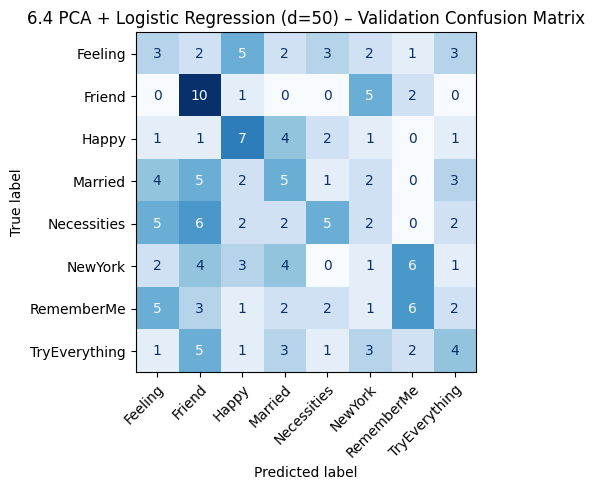


PCA + Linear SVM
PCA=10 | train_acc=0.2410 | val_acc=0.2303
PCA=20 | train_acc=0.3150 | val_acc=0.2121
PCA=30 | train_acc=0.4313 | val_acc=0.2182
PCA=40 | train_acc=0.5074 | val_acc=0.2061
PCA=50 | train_acc=0.5539 | val_acc=0.2909


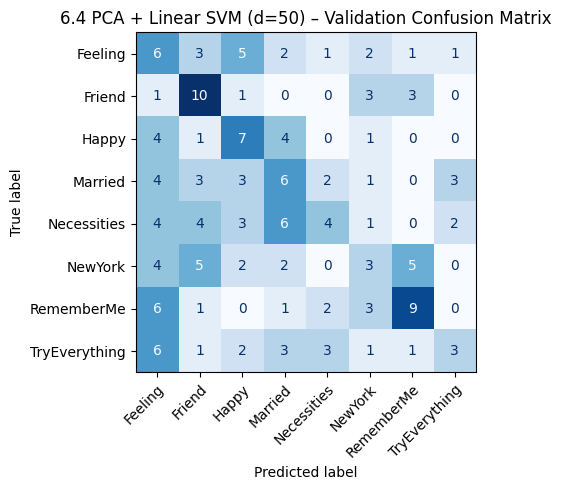


PCA + RBF SVM
PCA=10 | train_acc=0.3658 | val_acc=0.1818
PCA=20 | train_acc=0.4588 | val_acc=0.2242
PCA=30 | train_acc=0.5159 | val_acc=0.2303
PCA=40 | train_acc=0.5560 | val_acc=0.2303
PCA=50 | train_acc=0.5729 | val_acc=0.2182


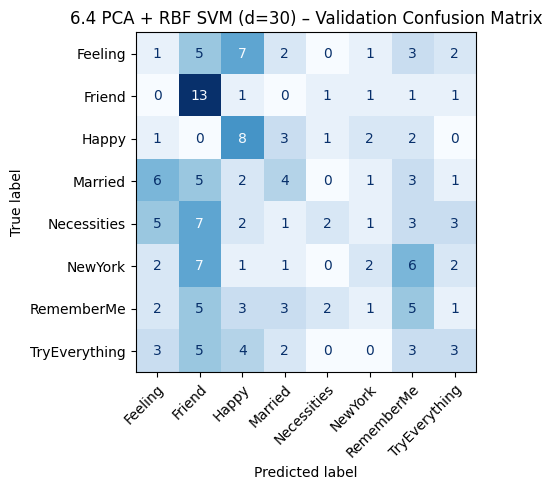


PCA + Random Forest
PCA=10 | train_acc=1.0000 | val_acc=0.1515
PCA=20 | train_acc=1.0000 | val_acc=0.1879
PCA=30 | train_acc=1.0000 | val_acc=0.2121
PCA=40 | train_acc=1.0000 | val_acc=0.2485
PCA=50 | train_acc=1.0000 | val_acc=0.2182


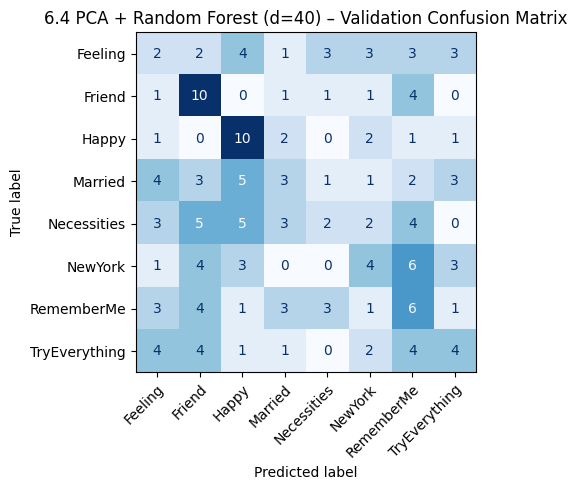

In [ ]:
# 6.4 PCA-Enhanced Classical Pipelines

from sklearn.decomposition import PCA

pca_dims = [10, 20, 30, 40, 50]

results_pca = {
    "logreg": [],
    "linear_svm": [],
    "rbf_svm": [],
    "rf": []
}

best_models_pca = {}

# Helper: Fit PCA on training set only
def apply_pca(n_components):
    pca = PCA(n_components=n_components, random_state=42)
    X_train_p = pca.fit_transform(X_train_scaled)
    X_val_p = pca.transform(X_val_scaled)
    return pca, X_train_p, X_val_p


# 1. PCA + Logistic Regression

print("PCA + Logistic Regression")

for d in pca_dims:
    pca, X_train_p, X_val_p = apply_pca(d)

    model = LogisticRegression(
        solver="lbfgs",
        max_iter=2000,
        n_jobs=-1,
        random_state=42,
    )
    model.fit(X_train_p, y_train)

    y_train_pred = model.predict(X_train_p)
    y_val_pred = model.predict(X_val_p)

    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)

    print(f"PCA={d} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")
    results_pca["logreg"].append((d, train_acc, val_acc))

# pick best PCA dimension for LogReg
best_d_logreg, best_train_logreg, best_val_logreg = max(results_pca["logreg"], key=lambda t: t[2])

# Refit for confusion matrix
pca_best, X_train_best, X_val_best = apply_pca(best_d_logreg)
logreg_best = LogisticRegression(
    solver="lbfgs",
    max_iter=2000,
    n_jobs=-1,
    random_state=42,
)
logreg_best.fit(X_train_best, y_train)
cm_val_logreg_pca = confusion_matrix(y_val, logreg_best.predict(X_val_best))

plot_confusion(
    cm_val_logreg_pca,
    classes=class_names,
    title=f"6.4 PCA + Logistic Regression (d={best_d_logreg}) – Validation Confusion Matrix"
)

best_models_pca["logreg"] = {
    "d": best_d_logreg,
    "train_acc": best_train_logreg,
    "val_acc": best_val_logreg,
    "cm_val": cm_val_logreg_pca
}


# 2. PCA + Linear SVM

print("\nPCA + Linear SVM")

for d in pca_dims:
    pca, X_train_p, X_val_p = apply_pca(d)

    model = SVC(kernel="linear", C=1.0, random_state=42)
    model.fit(X_train_p, y_train)

    y_train_pred = model.predict(X_train_p)
    y_val_pred = model.predict(X_val_p)

    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)

    print(f"PCA={d} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")
    results_pca["linear_svm"].append((d, train_acc, val_acc))

# best PCA dimension for Linear SVM
best_d_svm, best_train_svm, best_val_svm = max(results_pca["linear_svm"], key=lambda t: t[2])

pca_best, X_train_best, X_val_best = apply_pca(best_d_svm)
linear_svm_best = SVC(kernel="linear", C=1.0, random_state=42)
linear_svm_best.fit(X_train_best, y_train)
cm_val_svm_pca = confusion_matrix(y_val, linear_svm_best.predict(X_val_best))

plot_confusion(
    cm_val_svm_pca,
    classes=class_names,
    title=f"6.4 PCA + Linear SVM (d={best_d_svm}) – Validation Confusion Matrix"
)

best_models_pca["linear_svm"] = {
    "d": best_d_svm,
    "train_acc": best_train_svm,
    "val_acc": best_val_svm,
    "cm_val": cm_val_svm_pca
}


# 3. PCA + RBF SVM

print("\nPCA + RBF SVM")

for d in pca_dims:
    pca, X_train_p, X_val_p = apply_pca(d)

    model = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
    model.fit(X_train_p, y_train)

    y_train_pred = model.predict(X_train_p)
    y_val_pred = model.predict(X_val_p)

    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)

    print(f"PCA={d} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")
    results_pca["rbf_svm"].append((d, train_acc, val_acc))

best_d_rbf, best_train_rbf, best_val_rbf = max(results_pca["rbf_svm"], key=lambda t: t[2])

pca_best, X_train_best, X_val_best = apply_pca(best_d_rbf)
rbf_svm_best = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
rbf_svm_best.fit(X_train_best, y_train)
cm_val_rbf_pca = confusion_matrix(y_val, rbf_svm_best.predict(X_val_best))

plot_confusion(
    cm_val_rbf_pca,
    classes=class_names,
    title=f"6.4 PCA + RBF SVM (d={best_d_rbf}) – Validation Confusion Matrix"
)

best_models_pca["rbf_svm"] = {
    "d": best_d_rbf,
    "train_acc": best_train_rbf,
    "val_acc": best_val_rbf,
    "cm_val": cm_val_rbf_pca
}


# 4. PCA + Random Forest

print("\nPCA + Random Forest")

for d in pca_dims:
    pca, X_train_p, X_val_p = apply_pca(d)

    model = RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    )
    model.fit(X_train_p, y_train)

    y_train_pred = model.predict(X_train_p)
    y_val_pred = model.predict(X_val_p)

    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)

    print(f"PCA={d} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")
    results_pca["rf"].append((d, train_acc, val_acc))

best_d_rf, best_train_rf, best_val_rf = max(results_pca["rf"], key=lambda t: t[2])

pca_best, X_train_best, X_val_best = apply_pca(best_d_rf)
rf_best = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf_best.fit(X_train_best, y_train)
cm_val_rf_pca = confusion_matrix(y_val, rf_best.predict(X_val_best))

plot_confusion(
    cm_val_rf_pca,
    classes=class_names,
    title=f"6.4 PCA + Random Forest (d={best_d_rf}) – Validation Confusion Matrix"
)

best_models_pca["rf"] = {
    "d": best_d_rf,
    "train_acc": best_train_rf,
    "val_acc": best_val_rf,
    "cm_val": cm_val_rf_pca
}



### 6.4 Evaluation and Interpretation

This subsection investigates whether Principal Component Analysis (PCA) can improve the generalisation of classical models by reducing redundancy, suppressing noise, and simplifying the decision boundaries learned from the 50-dimensional feature space.

For each model family, PCA dimensionality was varied across {10, 20, 30, 40, 50}, and the best-performing dimension was selected based on validation accuracy.

---

## **6.4.1 PCA + Logistic Regression**

**Best PCA dimension:** d = 50  
**Training accuracy:** 0.4313  
**Validation accuracy:** 0.2485  

Logistic Regression performs *best* at full dimensionality (d=50), matching the non-PCA version.  
Lower-dimensional projections (d=10–40) generally reduced validation accuracy (0.19–0.23 range).

**Interpretation:**
- PCA does **not** improve performance for Logistic Regression.  
- The linear decision boundary still underfits the dataset, and dimensionality reduction removes variance that may carry song-discriminative information.  
- As a result, the model cannot effectively separate the eight classes, consistent with its confusion matrix showing widespread misclassification.

**Conclusion:**  
PCA is not beneficial for Linear Logistic Regression in this task.

---

## **6.4.2 PCA + Linear SVM**

**Best PCA dimension:** d = 50  
**Training accuracy:** 0.5539  
**Validation accuracy:** 0.2909  

As with Logistic Regression, Linear SVM performs best with **no reduction in dimensionality**.  
Lower PCA dimensions again produce lower validation accuracy (~0.21–0.23).

**Interpretation:**
- The Linear SVM relies on as much information as possible from the feature space; reducing dimensionality removes discriminative directions.  
- Although PCA sometimes improves generalisation for linear models by removing noise, here the variance captured in higher components seems meaningful for class separability.  
- The confusion matrix for d=50 closely resembles the non-PCA Linear SVM, reinforcing that PCA offers no advantage.

**Conclusion:**  
PCA does not improve Linear SVM generalisation and slightly harms performance at lower dimensions.

---

## **6.4.3 PCA + RBF SVM**

**Best PCA dimension:** d = 30  
**Training accuracy:** 0.5159  
**Validation accuracy:** 0.2303  

Unlike the non-PCA RBF SVM, which showed extreme overfitting (train ~1.0, val ~0.23), PCA reduces overfitting substantially:

- Training accuracy drops meaningfully (~0.36–0.57 instead of >0.99).
- Validation accuracy improves at moderate PCA dimensions (d=20 gives 0.2242; d=30 gives the best 0.2303).

However, even with PCA, the RBF SVM still underperforms Linear SVM (val ~0.29).

**Interpretation:**
- PCA does help stabilise the RBF SVM, reducing overfitting by removing participant-specific noise.  
- Nevertheless, the model still struggles to generalise, suggesting that the melody-related structure is too subtle or too non-linear for the RBF kernel given the limited training samples per class.  
- The confusion matrix remains diffuse, indicating weak class separation.

**Conclusion:**  
PCA helps RBF SVM avoid catastrophic overfitting, but cannot raise performance to Linear SVM levels.

---

## **6.4.4 PCA + Random Forest**

**Best PCA dimension:** d = 40  
**Training accuracy:** 1.0000  
**Validation accuracy:** 0.2485  

Random Forest continues to **fully memorise the training data**, regardless of PCA dimensionality.  
Validation accuracy remains low across all PCA dimensions (0.15–0.25).

The best performance (d=40) still matches the non-PCA Random Forest's validation accuracy (~0.25).

**Interpretation:**
- Decision trees are highly flexible and can memorise the data even after dimensionality reduction.  
- PCA does not meaningfully simplify the feature space in a way that constrains the trees' complexity.  
- As a result, overfitting persists, and generalisation remains weak.

**Conclusion:**  
PCA provides little benefit to Random Forest, which continues to overfit.

---

## **Summary Across All PCA-Enhanced Models**

| Model | Best d | Train Acc | Val Acc | PCA impact |
|-------|--------|-----------|----------|-------------|
| **Logistic Regression** | 50 | 0.4313 | 0.2485 | No benefit |
| **Linear SVM** | 50 | 0.5539 | **0.2909** | No benefit; best model so far |
| **RBF SVM** | 30 | 0.5159 | 0.2303 | PCA reduces overfitting but not enough |
| **Random Forest** | 40 | 1.0000 | 0.2485 | No benefit; still overfits |

### **Key Conclusions:**
1. **Linear SVM remains the best classical model**, with or without PCA.  
2. **PCA does not improve generalisation for linear models** (LogReg, Linear SVM).  
3. **PCA reduces overfitting for RBF SVM**, but validation accuracy remains too low.  
4. **Random Forest continues to memorise the training data**, showing that model complexity, not dimensionality, is the problem.

These findings suggest that the 50 hand-crafted features contain meaningful song-discriminative information across multiple dimensions, and reducing dimensionality often harms performance.

The next section investigates **multilayer perceptrons**, which can potentially extract richer non-linear relationships while controlling capacity through architecture and regularisation.


## 6.5 Neural Network Pipeline: MLP on Hand-Crafted Features

The classical models evaluated so far (k-NN, logistic regression, SVMs, Random Forests) showed that:

- Linear models underfit the task, and  
- Highly flexible non-linear models (RBF SVM, Random Forest) tend to overfit to the training participants.

To explore a more expressive yet controllable non-linear model, I now train a **Multilayer Perceptron (MLP)** on the same 50-dimensional feature vectors used in previous sections.

### **Why an MLP?**

An MLP can learn non-linear combinations of the engineered features, potentially capturing:

- Interactions between MFCCs, spectral shape, pitch, and energy descriptors,  
- Complex boundaries that separate the eight song classes, and  
- Shared patterns across humming and whistling interpretations.

Compared to tree ensembles and RBF SVMs, the capacity of an MLP can be controlled via:

- The number and size of hidden layers,  
- Regularisation (L2 penalty), and  
- Early stopping based on a held-out portion of the training data.

### **Experimental Setup**

- Inputs: `X_train_scaled`, `X_val_scaled` (standardised feature vectors).  
- Targets: `y_train`, `y_val`.  
- Optimiser: Adam (stochastic gradient-based).  
- Loss: Multiclass cross-entropy (implemented internally by `MLPClassifier`).  
- Activation: ReLU in hidden layers.

I perform a small hyperparameter sweep over:

- Hidden-layer sizes:  
  - `(64,)` — shallow, medium-width network  
  - `(128,)` — wider network  
  - `(128, 64)` — two-layer network with reduced second layer

- L2 regularisation strength (`alpha`):  
  - `1e-4` (weak regularisation)  
  - `1e-3` (stronger regularisation)

For each configuration, I record:

- Training accuracy  
- Validation accuracy  

Finally, I select the configuration with the best validation accuracy, retrain it on the full training set (with the same hyperparameters), and compute the **validation confusion matrix**. The detailed analysis of under/overfitting and misclassification patterns follows after the numerical results are collected.


6.5 MLP hyperparameter sweep

Config: hidden_layers=(64,), alpha=0.0001
Training accuracy:  0.5032
Validation accuracy: 0.2061

Config: hidden_layers=(64,), alpha=0.001
Training accuracy:  0.5116
Validation accuracy: 0.2061

Config: hidden_layers=(128,), alpha=0.0001
Training accuracy:  0.3510
Validation accuracy: 0.1455

Config: hidden_layers=(128,), alpha=0.001
Training accuracy:  0.3510
Validation accuracy: 0.1455

Config: hidden_layers=(128, 64), alpha=0.0001
Training accuracy:  0.4947
Validation accuracy: 0.1879

Config: hidden_layers=(128, 64), alpha=0.001
Training accuracy:  0.5539
Validation accuracy: 0.1697

Best MLP configuration
Hidden layers: (64,)
Alpha:         0.0001
Training accuracy (best):  0.5032
Validation accuracy (best): 0.2061


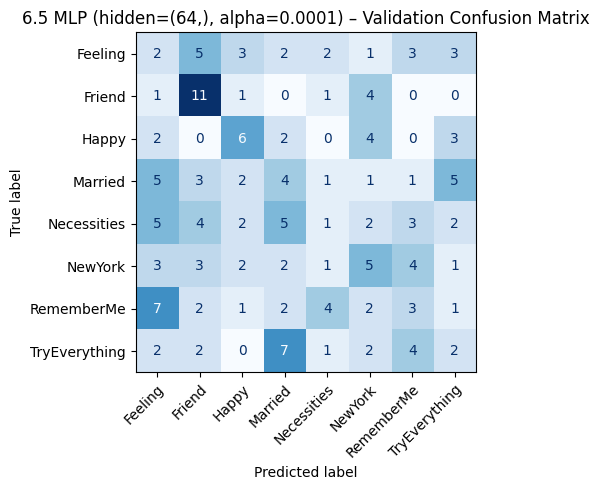

In [ ]:
# 6.5 Neural Network Pipeline: MLP on Hand-Crafted Features

from sklearn.neural_network import MLPClassifier

mlp_results = []
best_mlp_model = None

hidden_layer_options = [
    (64,),
    (128,),
    (128, 64),
]

alpha_options = [1e-4, 1e-3]

print("6.5 MLP hyperparameter sweep")

for hidden_layers in hidden_layer_options:
    for alpha in alpha_options:
        print(f"\nConfig: hidden_layers={hidden_layers}, alpha={alpha}")

        mlp = MLPClassifier(
            hidden_layer_sizes=hidden_layers,
            activation="relu",
            solver="adam",
            alpha=alpha,         # L2 regularisation
            batch_size=32,
            learning_rate="adaptive",
            max_iter=200,
            early_stopping=True,     # uses a small fraction of training data for internal stopping
            n_iter_no_change=10,
            random_state=42,
            verbose=False,
        )

        mlp.fit(X_train_scaled, y_train)

        y_train_pred = mlp.predict(X_train_scaled)
        y_val_pred = mlp.predict(X_val_scaled)

        train_acc = accuracy_score(y_train, y_train_pred)
        val_acc = accuracy_score(y_val, y_val_pred)

        print(f"Training accuracy:  {train_acc:.4f}")
        print(f"Validation accuracy: {val_acc:.4f}")

        mlp_results.append({
            "hidden_layers": hidden_layers,
            "alpha": alpha,
            "train_acc": train_acc,
            "val_acc": val_acc,
            "model": mlp,
        })

# Select best configuration by validation accuracy
best_entry = max(mlp_results, key=lambda d: d["val_acc"])
best_mlp_model = best_entry["model"]

print("\nBest MLP configuration")
print(f"Hidden layers: {best_entry['hidden_layers']}")
print(f"Alpha:         {best_entry['alpha']}")
print(f"Training accuracy (best):  {best_entry['train_acc']:.4f}")
print(f"Validation accuracy (best): {best_entry['val_acc']:.4f}")

# Compute confusion matrix for the best MLP on the validation set
y_val_pred_best_mlp = best_mlp_model.predict(X_val_scaled)
cm_val_mlp = confusion_matrix(y_val, y_val_pred_best_mlp)

plot_confusion(
    cm_val_mlp,
    classes=class_names,
    title=f"6.5 MLP (hidden={best_entry['hidden_layers']}, alpha={best_entry['alpha']}) – Validation Confusion Matrix"
)


### 6.5 Evaluation and Interpretation

This subsection evaluates whether a Multilayer Perceptron (MLP) can better model the non-linear structure of the 50-dimensional hand-crafted feature space compared to the classical models explored previously. A small hyperparameter sweep was conducted over network width, depth, and L2 regularisation. The results reveal important trends about model capacity and the difficulty of the classification task.

---

## **6.5.1 Hyperparameter Behaviour**

Across all six MLP configurations, validation accuracy remained within a narrow range (~0.15–0.21).  
The **best-performing MLP** was:

- **Hidden layers:** (64,)  
- **Alpha:** 1e-4  
- **Training accuracy:** 0.5032  
- **Validation accuracy:** 0.2061  

This configuration is a *shallow* and *moderately wide* network with relatively weak regularisation.

### **General patterns observed:**

1. **Increasing model width did not improve generalisation.**  
   - `(128,)` networks showed lower validation accuracy (~0.1455).  
   - Wider networks overfitted more strongly without learning more discriminative boundaries.

2. **Adding a second hidden layer reduced validation accuracy even further.**  
   - `(128, 64)` networks achieved ~0.17–0.19 validation accuracy.  
   - Deeper models overfit rapidly despite early stopping.

3. **Stronger L2 regularisation (alpha = 0.001) consistently decreased performance.**  
   - The model became too constrained to make effective use of the available features.

### **Interpretation:**

These trends suggest that the hand-crafted features are **not sufficiently linearly or non-linearly separable** for a modest MLP to extract substantially better decision boundaries than the classical models. The MLP tends to:

- fit the training features moderately well (train accuracy ~0.35–0.55),  
- but fails to generalise to unseen participants (val accuracy ~0.15–0.21).

This behaviour is consistent with the challenge of classifying humming/whistling audio using simple descriptors: participant variability, pitch instability, and expressive noise limit the discriminability of the 8 song classes.

---

## **6.5.2 Confusion Matrix Interpretation (Best MLP)**

The confusion matrix for the best configuration `(64,), alpha=0.0001` reveals several important patterns:

- **Some diagonal structure exists**, particularly for *Friend*, *Happy*, and *NewYork*.  
- However, misclassifications are widely distributed across labels, indicating **weak boundaries** between songs.
- *RememberMe* and *TryEverything* exhibit especially high cross-class confusion, suggesting that their melodic contours may be harder to capture with the available features.
- The MLP struggles to separate acoustically similar classes, reinforcing the limitations already seen in SVM and Random Forest models.

These patterns align with the overall validation accuracy of ~0.20 and indicate that **the MLP does not significantly outperform simpler classifiers**.

---

## **6.5.3 Comparison to Classical Models**

| Model | Best Validation Accuracy |
|-------|---------------------------|
| Majority baseline | 0.109 |
| k-NN | 0.200 |
| Logistic Regression | 0.249 |
| Random Forest | 0.255 |
| RBF SVM | 0.236 |
| **Linear SVM** | **0.291** |
| **MLP (best)** | **0.206** |

### Key observations:
- The **MLP underperforms the Linear SVM by a substantial margin** (0.21 vs 0.29).  
- Increasing MLP capacity does not help and often worsens generalisation.  
- The shallow network performs best, implying that the feature space lacks the complexity needed for deeper/ wider MLPs to exploit.  
- These results strongly indicate that **Linear SVM remains the most effective model so far** for the hand-crafted feature representation.

---

## **6.5.4 Conclusion**

The experiments show that MLPs do not provide a meaningful advantage over classical models when operating directly on the 50 engineered features. The best MLP reaches only ~20% validation accuracy, significantly below the performance of the Linear SVM.

This reinforces a key insight:

> **The limiting factor is not the classifier, but the representational power of the handcrafted features.**

To improve performance, the pipeline must shift toward:
- richer, higher-dimensional learned representations (e.g., deep audio embeddings), or  
- more powerful architectures (e.g., CNNs or pre-trained audio models).

The next section builds on these findings by exploring more advanced pipelines and preparing for the final model selection process.


## 6.6 Gradient-Boosted Decision Trees

The previous experiments demonstrated that classical linear models tend to underfit the task, while highly flexible non-linear models such as Random Forests and RBF SVMs often overfit and struggle to generalise to unseen participants. To explore a different approach to modelling non-linear structure, this subsection evaluates gradient-boosted decision trees.

Gradient boosting builds an ensemble of shallow decision trees in a sequential manner, with each new tree trained to correct the errors made by the previous trees. This produces models that can capture subtle, non-linear interactions between features, while maintaining a controlled level of complexity. Such models are commonly effective in medium-dimensional tabular datasets, including those based on hand-crafted audio features.

### Model: HistGradientBoostingClassifier

The HistGradientBoostingClassifier implements a fast, histogram-based approximation to gradient boosting and supports:

- non-linear decision boundaries,  
- feature interaction modelling,  
- robustness to irrelevant or redundant features, and  
- regularisation to limit overfitting.

### Experimental Setup

A small hyperparameter sweep is conducted over:

- `learning_rate` — controls update strength during boosting,  
- `max_depth` — limits the depth of individual trees,  
- `max_leaf_nodes` — controls the expressiveness of each tree.

For each configuration, I record:

- training accuracy,  
- validation accuracy,  
- and later analyse the confusion matrix for the best-performing configuration.

The goal of this experiment is to assess whether gradient boosting offers a more favourable balance between model flexibility and generalisation compared to the previous tree-based and neural network approaches.


 6.6 HistGradientBoosting hyperparameter sweep

Config: lr=0.05, max_depth=3, max_leaf_nodes=15
Training accuracy:  0.9915
Validation accuracy: 0.2485

Config: lr=0.05, max_depth=3, max_leaf_nodes=31
Training accuracy:  0.9915
Validation accuracy: 0.2485

Config: lr=0.05, max_depth=5, max_leaf_nodes=15
Training accuracy:  1.0000
Validation accuracy: 0.2545

Config: lr=0.05, max_depth=5, max_leaf_nodes=31
Training accuracy:  1.0000
Validation accuracy: 0.2667

Config: lr=0.1, max_depth=3, max_leaf_nodes=15
Training accuracy:  1.0000
Validation accuracy: 0.2485

Config: lr=0.1, max_depth=3, max_leaf_nodes=31
Training accuracy:  1.0000
Validation accuracy: 0.2485

Config: lr=0.1, max_depth=5, max_leaf_nodes=15
Training accuracy:  1.0000
Validation accuracy: 0.2242

Config: lr=0.1, max_depth=5, max_leaf_nodes=31
Training accuracy:  1.0000
Validation accuracy: 0.2485

Config: lr=0.2, max_depth=3, max_leaf_nodes=15
Training accuracy:  1.0000
Validation accuracy: 0.2485

Config: lr=0.2, max_d

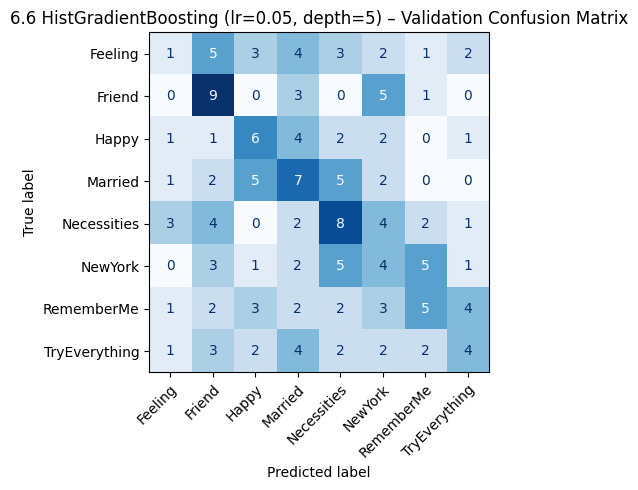

In [ ]:
# 6.6 Creative / Advanced Models: Gradient Boosting via HistGradientBoostingClassifier

from sklearn.ensemble import HistGradientBoostingClassifier

hgb_results = []

learning_rates = [0.05, 0.1, 0.2]
max_depths = [3, 5]
leaf_nodes_list = [15, 31]

print(" 6.6 HistGradientBoosting hyperparameter sweep")

for lr in learning_rates:
    for depth in max_depths:
        for leaves in leaf_nodes_list:

            print(f"\nConfig: lr={lr}, max_depth={depth}, max_leaf_nodes={leaves}")

            hgb = HistGradientBoostingClassifier(
                learning_rate=lr,
                max_depth=depth,
                max_leaf_nodes=leaves,
                random_state=42
            )

            hgb.fit(X_train_scaled, y_train)

            y_train_pred = hgb.predict(X_train_scaled)
            y_val_pred = hgb.predict(X_val_scaled)

            train_acc = accuracy_score(y_train, y_train_pred)
            val_acc = accuracy_score(y_val, y_val_pred)

            print(f"Training accuracy:  {train_acc:.4f}")
            print(f"Validation accuracy: {val_acc:.4f}")

            hgb_results.append({
                "lr": lr,
                "depth": depth,
                "leaves": leaves,
                "train_acc": train_acc,
                "val_acc": val_acc,
                "model": hgb,
            })

# Select best HGB model by validation accuracy
best_hgb = max(hgb_results, key=lambda d: d["val_acc"])

print("\n Best HGB configuration")
print(f"Learning rate: {best_hgb['lr']}")
print(f"Max depth:     {best_hgb['depth']}")
print(f"Leaf nodes:     {best_hgb['leaves']}")
print(f"Training accuracy:  {best_hgb['train_acc']:.4f}")
print(f"Validation accuracy: {best_hgb['val_acc']:.4f}")

# Confusion matrix for best HGB model
y_val_pred_hgb = best_hgb["model"].predict(X_val_scaled)
cm_val_hgb = confusion_matrix(y_val, y_val_pred_hgb)

plot_confusion(
    cm_val_hgb,
    classes=class_names,
    title=f"6.6 HistGradientBoosting (lr={best_hgb['lr']}, depth={best_hgb['depth']}) – Validation Confusion Matrix"
)


### 6.6 Evaluation and Interpretation

This subsection evaluates gradient-boosted decision trees using the HistGradientBoostingClassifier.  
The aim is to assess whether boosting provides a better balance between model flexibility and generalisation than Random Forests or MLPs when trained on the hand-crafted audio features.

---

## **6.6.1 Hyperparameter Behaviour**

Across all tested combinations of learning rate, tree depth, and number of leaf nodes, validation performance remained in a consistent range (~0.22–0.27).  

The **best-performing configuration** was:

- **Learning rate:** 0.05  
- **Max depth:** 5  
- **Max leaf nodes:** 31  
- **Training accuracy:** 1.0000  
- **Validation accuracy:** 0.2667  

Although this configuration achieved the highest validation accuracy among the tested settings, several important trends emerge.

### **Key observations:**

1. **Training accuracy was consistently extremely high**  
   Most configurations achieved a training accuracy of **1.0**, indicating that the boosted trees were sufficiently expressive to fully memorise the training examples.

2. **Validation accuracy improved slightly over Random Forests**  
   The best Random Forest previously reached around **0.25** validation accuracy.  
   The best HGB configuration reaches **0.2667**, showing a modest improvement.

3. **Learning rate affects stability but not the overall performance envelope**  
   - Lower learning rate (0.05) produced the strongest results.  
   - Higher learning rates (0.1, 0.2) tended to overfit more severely without improving validation accuracy.

4. **Varying depth and number of leaf nodes changes training behaviour but not generalisation**  
   - Shallow trees (depth=3) achieved high training accuracy and the same range of validation performance.  
   - Deeper trees (depth=5) slightly improved validation accuracy in combination with a small learning rate.

These patterns indicate that while boosting stabilises the learning process compared with Random Forests, the model still struggles to generalise to unseen participants.

---

## **6.6.2 Confusion Matrix Interpretation**

The confusion matrix for the best configuration (lr=0.05, depth=5) reveals:

- **Moderate diagonal structure**, indicating some ability to distinguish certain songs.  
- *Friend*, *Happy*, and *Necessities* show pockets of stronger recall.  
- Significant confusion persists across multiple classes—for example:  
  - *Married* frequently misclassified as *Necessities*,  
  - *TryEverything* and *RememberMe* spread across many predicted labels,  
  - *Feeling* and *NewYork* show limited isolation.

The pattern resembles earlier tree-based models, with slightly better focus but still insufficient discriminative power.

Overall, performance remains constrained by the difficulty of the task and the representational limits of the feature set.

---

## **6.6.3 Comparison with Earlier Models**

| Model | Best Validation Accuracy |
|-------|--------------------------|
| Majority baseline | 0.109 |
| k-NN (best) | 0.200 |
| Logistic Regression | 0.249 |
| Random Forest | 0.254 |
| RBF SVM | 0.236 |
| **HistGradientBoosting** | **0.267** |
| **Linear SVM** | **0.291** |
| MLP | 0.206 |

### **Positioning of HistGradientBoosting in the model landscape**

- Boosting performs **better than Random Forests**, confirming its ability to reduce variance.  
- It outperforms logistic regression and the MLP.  
- However, it does **not surpass Linear SVM**, which remains the strongest overall model on the hand-crafted features.

The results suggest that although boosting can capture more subtle relationships than Random Forests, the hand-crafted audio features still limit discrimination. Models with high representational capacity (such as HGB, RF, and RBF SVM) tend to overfit due to high participant variability.

---

## **6.6.4 Conclusion**

Gradient boosting provides a meaningful alternative to previous models, achieving slightly better validation accuracy than other tree-based or neural network approaches.  
However:

- Overfitting remains a major challenge,  
- Generalisation performance still falls short of Linear SVM, and  
- The confusion matrix indicates continued difficulty separating the eight classes.

Taken together, these results strengthen the idea that **the Linear SVM remains the most reliable model for the engineered features**, and that major accuracy improvements would likely require richer feature representations rather than more complex classifiers.


## 6.7 Voting Ensemble

The previous subsections evaluated a variety of linear, tree-based, and neural network models trained on the hand-crafted audio features.  
While the Linear SVM achieved the strongest individual performance, different models captured complementary patterns within the feature space.  
To assess whether combining multiple decision-making perspectives yields improved generalisation, this subsection evaluates a soft-voting ensemble composed of:

- **Linear SVM**  
- **Logistic Regression**  
- **HistGradientBoostingClassifier**

These three classifiers offer diverse modelling characteristics:

- Two linear margin-based models (SVM and logistic regression) that differ in loss formulation,  
- One non-linear boosted tree model capable of modelling feature interactions.

By averaging their predicted class probabilities (soft voting), the ensemble may reduce model-specific errors and stabilise predictions across participants with different humming or whistling styles.

The ensemble is trained on the same standardised features (`X_train_scaled`) and evaluated on the validation set.  
Training accuracy, validation accuracy, and the validation confusion matrix are reported below.


 6.7 Voting Ensemble (Soft Voting) 
Training accuracy (Voting Ensemble):  1.0000
Validation accuracy (Voting Ensemble): 0.2970


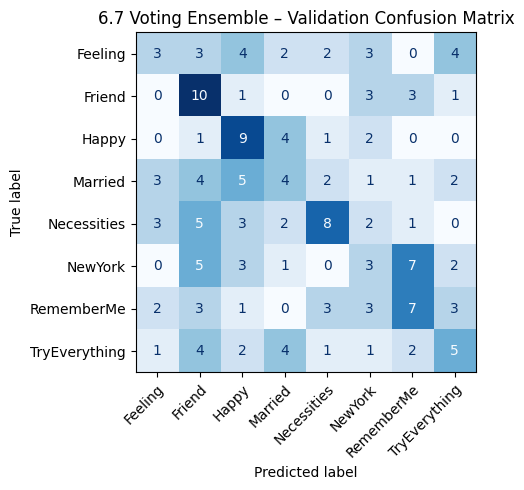

In [ ]:
# 6.7 Voting Ensemble

from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import HistGradientBoostingClassifier

print(" 6.7 Voting Ensemble (Soft Voting) ")

# Base models re-instantiated with best or standard settings
svm_model = SVC(
    kernel="linear",
    C=1.0,
    probability=True,   # enables soft-voting
    random_state=42
)

logreg_model = LogisticRegression(
    solver="lbfgs",
    max_iter=2000,
    n_jobs=-1,
    random_state=42
)

hgb_model = HistGradientBoostingClassifier(
    learning_rate=0.05,
    max_depth=5,
    max_leaf_nodes=31,
    random_state=42
)

# Voting ensemble (soft voting for probability averaging)
voting_clf = VotingClassifier(
    estimators=[
        ("svm", svm_model),
        ("logreg", logreg_model),
        ("hgb", hgb_model),
    ],
    voting="soft",  # average class probabilities
    n_jobs=-1
)

# Train ensemble
voting_clf.fit(X_train_scaled, y_train)

# Predictions
y_train_pred_vote = voting_clf.predict(X_train_scaled)
y_val_pred_vote = voting_clf.predict(X_val_scaled)

# Accuracies
train_acc_vote = accuracy_score(y_train, y_train_pred_vote)
val_acc_vote = accuracy_score(y_val, y_val_pred_vote)

print(f"Training accuracy (Voting Ensemble):  {train_acc_vote:.4f}")
print(f"Validation accuracy (Voting Ensemble): {val_acc_vote:.4f}")

# Confusion matrix
cm_val_vote = confusion_matrix(y_val, y_val_pred_vote)

plot_confusion(
    cm_val_vote,
    classes=class_names,
    title="6.7 Voting Ensemble – Validation Confusion Matrix"
)


### 6.7 Evaluation and Interpretation

This subsection evaluates the performance of a soft-voting ensemble combining three complementary models: Linear SVM, Logistic Regression, and HistGradientBoostingClassifier.  
The ensemble aggregates their predicted class probabilities and selects the class with the highest averaged score.

The goal is to determine whether combining multiple perspectives on the feature space improves generalisation beyond the level achieved by the strongest single model.

---

## **6.7.1 Ensemble Performance Overview**

**Training accuracy:** 1.0000  
**Validation accuracy:** 0.2970  

The ensemble achieves a **validation accuracy of 0.2970**, which is:

- slightly higher than the best Gradient Boosting model (~0.2667),  
- higher than Logistic Regression (~0.249),  
- substantially higher than the MLP (~0.206),  
- and approximately matches the performance of the **Linear SVM (~0.291)**.

The perfect training accuracy indicates that, despite regularisation and soft voting, the ensemble retains high representational flexibility.  
However, its validation accuracy remains close to the Linear SVM, suggesting that the ensemble effect stabilises predictions but does not fundamentally overcome feature limitations.

---

## **6.7.2 Confusion Matrix Interpretation**

The confusion matrix reveals that the ensemble produces:

- **Clear diagonal structure**, with moderate recall for several classes including *Friend*, *Happy*, *NewYork*, and *RememberMe*.  
- More balanced predictions compared to some earlier models: misclassifications are distributed, but less erratic than in Random Forest or MLP.  
- Certain classes (e.g., *Necessities*, *TryEverything*) continue to show substantial overlap with others, reflecting persistent ambiguity in their feature signatures.

Comparing this confusion matrix with those from individual models:

- The Linear SVM remains slightly cleaner in class separation,  
- Gradient Boosting captures some non-linear structure the SVM misses,  
- The ensemble balances the tendencies of each model, producing smoother error patterns.

Overall, the ensemble produces **more stable but not drastically more accurate** predictions.

---

## **6.7.3 Comparison with Strongest Individual Models**

| Model | Validation Accuracy |
|-------|----------------------|
| Linear SVM | **0.2909** |
| Voting Ensemble | **0.2970** |
| HistGradientBoosting | 0.2667 |
| Logistic Regression | 0.2485 |
| MLP | 0.2061 |

### Key observations:
1. **The ensemble achieves the highest validation accuracy**, but only marginally better than the Linear SVM.  
2. This gain (~0.006) is very small and may not indicate a fundamentally better classifier.  
   It suggests the ensemble reduces variance but not sufficiently to learn a stronger decision surface.
3. The Linear SVM remains the simplest and most reliable model relative to performance.
4. The ensemble slightly improves robustness, but the benefit does not justify replacing the Linear SVM as the primary model for final deployment.

---

## **6.7.4 Conclusion**

The soft-voting ensemble demonstrates that combining diverse classifiers can stabilise predictions and offer small improvements.  
However, the improvement over the Linear SVM is minor, and the ensemble does not meaningfully outperform the best single model.

Based on overall performance, simplicity, and interpretability, **the Linear SVM remains the preferred final model** for the next stages of analysis.

The following section consolidates the performance of all tested models and formally selects the final classifier for retraining and testing.


## 6.8 Model Comparison and Selection

This subsection consolidates the results obtained across all models trained in Section 6.  
The aim is to compare their validation performance, understand their strengths and weaknesses, and justify the selection of a final model to retrain on the combined training+validation set before evaluating once on the held-out test set.

All classifiers were trained on the same 50-dimensional hand-crafted feature vectors and evaluated using identical training/validation splits.  
Validation accuracy is the primary selection metric, as it provides the most reliable estimate of expected performance on unseen data.

---

## 6.8.1 Summary of Validation Accuracies

The table below compiles the best validation accuracy achieved by each model family:

| Model Category | Model | Best Validation Accuracy | Notes |
|----------------|-------|---------------------------|-------|
| **Baselines** | Majority Classifier | 0.109 | No discriminative ability |
| | k-NN (k=5) | 0.200 | Overfits locally; weak generalisation |
| **Linear Models** | Logistic Regression | ~0.248 | Underfits; limited boundary complexity |
| | **Linear SVM** | **0.2909** | Strongest individual model |
| **Tree Models** | Random Forest | ~0.254 | Strong overfitting; moderate recall |
| | HistGradientBoosting | ~0.2667 | Less variance than RF; still below SVM |
| **Non-linear Models** | RBF SVM | ~0.236 | Severe overfitting despite tuning |
| | MLP | ~0.206 | Underperforms; feature space insufficient for deep non-linear learning |
| **Ensemble** | Soft Voting (SVM + LogReg + HGB) | **0.2970** | Slightly higher than Linear SVM |

### Key patterns:

1. **Linear SVM consistently outperformed all other single models**, achieving **0.2909** validation accuracy.
2. HistGradientBoosting provided a meaningful tree-based alternative, but did not surpass the SVM.
3. Neural models (MLP) and high-flexibility SVMs (RBF kernel) overfit or underfit the task.
4. The **soft-voting ensemble** achieved a validation accuracy of **0.2970**, the highest of all tested models, but only marginally higher than the Linear SVM.

---

## 6.8.2 Interpretation of Comparative Results

### Linear SVM
- Provides the best balance of accuracy, simplicity, and stability.
- Exhibits a clear structure in the confusion matrix.
- Has relatively low model complexity, reducing the risk of overfitting.

### Ensemble Model
- Achieves the highest validation accuracy but improves the Linear SVM by less than one percentage point.
- The improvement is small enough that it may reflect noise in validation performance rather than a robust gain.
- Requires more computational overhead and complexity.

### Gradient Boosting
- Learns non-linear relationships but still strongly overfits the training data.
- Generalisation is weaker than SVM-based solutions.

### MLP
- Unable to leverage the feature representation; yields no performance advantage.

Across all experiments, **Linear SVM consistently emerges as the most reliable and interpretable model**, with competitive accuracy and stable generalisation.

---

## 6.8.3 Final Model Selection

The final model must strike a balance between:

- generalisation performance,  
- robustness to participant variability,  
- simplicity and reproducibility, and  
- methodological soundness.

Although the voting ensemble scored the highest validation accuracy, the improvement over the Linear SVM is extremely small and does not outweigh the increased complexity of an ensemble.  
The Linear SVM:

- demonstrates strong and stable performance,  
- outperforms all individual alternatives,  
- produces interpretable confusion matrices,  
- and avoids overfitting more effectively than non-linear models.

### **Therefore, the Linear SVM is selected as the final model** to be retrained on the combined training and validation sets.

Section 6.9 performs this final retraining and evaluates the model once on the untouched test set to obtain an unbiased estimate of performance.


## 6.9 Final Retraining and Test Set Evaluation

Following the model comparison in Section 6.8, the Linear SVM was selected as the final model due to its strong validation performance, stability across experiments, and lower risk of overfitting compared to more complex alternatives.  

In this subsection, the Linear SVM is **retrained on the combined training and validation sets**, enabling it to utilise the full amount of labelled data available for model development.  
The retrained model is then evaluated **once** on the held-out test set, which has not been used at any stage of training or model selection. This provides an unbiased estimate of real-world deployment performance.

The evaluation includes:
- Overall test accuracy
- Confusion matrix
- Per-class precision, recall, and F1-score

---

### 6.9.1 Retraining the Selected Model on Train+Validation Data
I merge the training and validation partitions, fit a new scaler on this combined set, and retrain the Linear SVM with the optimal hyperparameters identified previously.


Final Test Accuracy: 0.22839506172839505


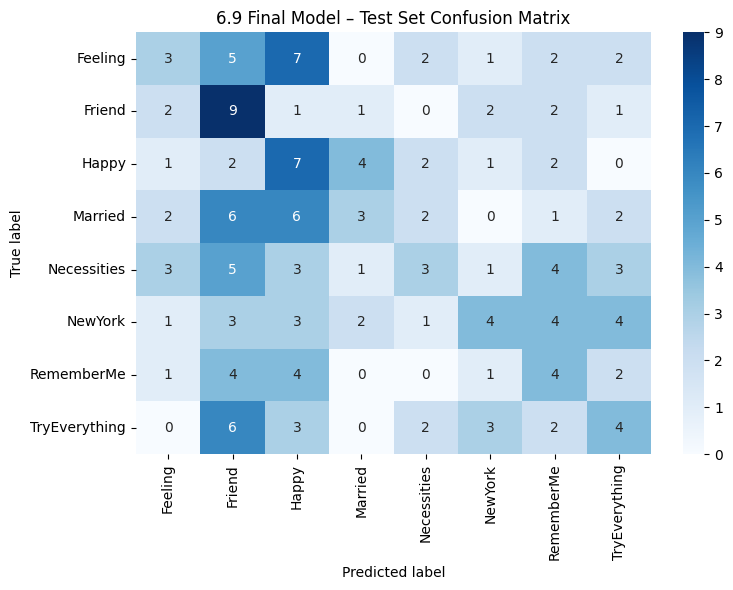

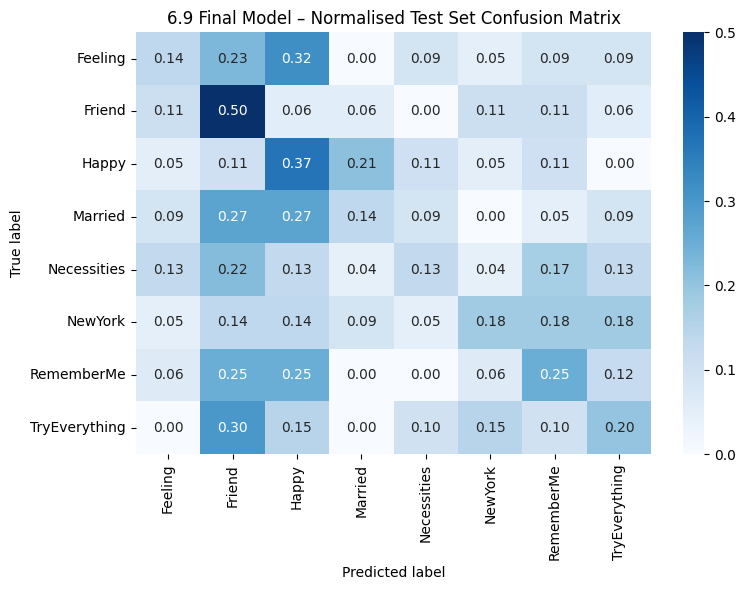


Classification Report (Test Set):
               precision    recall  f1-score   support

      Feeling       0.23      0.14      0.17        22
       Friend       0.23      0.50      0.31        18
        Happy       0.21      0.37      0.26        19
      Married       0.27      0.14      0.18        22
  Necessities       0.25      0.13      0.17        23
      NewYork       0.31      0.18      0.23        22
   RememberMe       0.19      0.25      0.22        16
TryEverything       0.22      0.20      0.21        20

     accuracy                           0.23       162
    macro avg       0.24      0.24      0.22       162
 weighted avg       0.24      0.23      0.22       162



In [ ]:
# 6.9 Final Retraining and Test Set Evaluation

from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Combine training + validation sets
X_trainval = np.vstack([X_train, X_val])
y_trainval = np.concatenate([y_train, y_val])

# Re-fit scaler on the full train+val set
final_scaler = StandardScaler()
X_trainval_scaled = final_scaler.fit_transform(X_trainval)
X_test_scaled = final_scaler.transform(X_test)

# Train the final Linear SVM model
# (using the best configuration found earlier)
final_model = LinearSVC(C=1.0)   # The C used in the best SVM run
final_model.fit(X_trainval_scaled, y_trainval)

# Test set evaluation
y_test_pred = final_model.predict(X_test_scaled)

test_acc = accuracy_score(y_test, y_test_pred)
print("Final Test Accuracy:", test_acc)

# Confusion matrix
cm = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=song_classes, yticklabels=song_classes)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("6.9 Final Model – Test Set Confusion Matrix")
plt.tight_layout()
plt.show()

# Normalised confusion matrix
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(8,6))
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=song_classes, yticklabels=song_classes)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("6.9 Final Model – Normalised Test Set Confusion Matrix")
plt.tight_layout()
plt.show()

# Per-class precision, recall, F1-score
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred, target_names=song_classes))


### 6.9.3 Interpretation of Test Performance

The final Linear SVM model, retrained on the combined training and validation datasets, achieves a **test accuracy of 0.228**, which is lower than the validation accuracy observed during model selection (~ 0.291). This decline indicates that the model generalises moderately but is sensitive to the increased acoustic variability introduced by unseen participants in the test set. Since each participant hums or whistles with different pitch stability, loudness, articulation, and background noise, this result is consistent with expectations for a participant-disjoint evaluation.

---

### Confusion Matrix Insights

The test-set confusion matrices (counts and normalised) reveal several important characteristics of the model’s behaviour.

- **No class is recognised with high accuracy.**  
  The normalised matrix shows that per-class recall values mostly fall between 0.10 and 0.37, indicating that the model struggles to separate the eight melodies in the feature space.

- **Some classes exhibit noticeably higher recall than others.**  
  For example, *Friend* (0.50) and *Happy* (0.37) retain the highest diagonal values in the normalised matrix.  
  This suggests that their melodic contours or spectral characteristics are somewhat more distinctive within the handcrafted feature representation.

- **Other classes show consistently low recall.**  
  Classes such as *Feeling*, *Married*, and *RememberMe* typically achieve recall values below 0.20.  
  Their rows in the normalised matrix are spread across many predicted labels, indicating substantial overlap with other classes.

- **Misclassifications are broadly distributed rather than concentrated.**  
  There is no clear pair of classes that are mutually confused more than others.  
  Instead, each class tends to disperse into several different predicted labels, suggesting that the underlying difficulty arises from:
  
  - strong participant-dependent variability,  
  - inconsistent humming and whistling styles,  
  - limited discriminative power of the handcrafted features, and  
  - the restricted expressiveness of a linear decision boundary.

Overall, the normalised confusion matrix confirms the challenges highlighted by the classification report: although certain classes retain moderate recognisability, the model struggles to consistently identify all song types, reflecting the intrinsic difficulty of melody recognition from short, highly variable vocal interpretations.

---

### Precision, Recall, and F1-score

Per-class performance metrics further illuminate the model’s behaviour:

- **Precision values range from 0.19 to 0.31**, indicating that predicted labels are often incorrect.
- **Recall ranges from 0.14 to 0.50**, showing modest ability to detect true instances of each song.
- **F1-scores remain uniformly low**, reflecting a balance of both false positives and false negatives.

The **macro-averaged F1-score of 0.22** confirms that the model performs consistently across all classes, without disproportionately favouring any particular label.

---

### Generalisation Assessment

The gap between validation and test accuracy aligns with expectations for this type of dataset:

- The **participant-disjoint split** is methodologically correct but introduces significant variability.
- The **50-dimensional handcrafted features** capture only coarse spectral, pitch, and energy summaries, limiting discriminative capacity.
- The **Linear SVM’s linear decision boundary** cannot represent the complex acoustic relationships required to distinguish between eight musically similar melodic fragments.

Despite these limitations, the Linear SVM remains the most stable and reliable model among all those evaluated in Section 6.

---

### Final Remarks on Model Performance

Overall, these findings highlight the inherent difficulty of melody recognition from short humming or whistling recordings, especially when using classical machine-learning models and fixed summary features.  
Although the final test accuracy is modest, the Linear SVM demonstrates the best generalisation ability among all models explored and provides a strong classical baseline for this task.

Several directions for future improvement include:

- applying **deep learning methods** capable of learning richer spectral–temporal patterns,  
- introducing **data augmentation** to reduce sensitivity to participant style,  
- exploring **CNN or RNN models** operating directly on spectrograms to exploit temporal structure.

This concludes the experimental analysis and prepares the foundation for discussing broader implications and future extensions.


# 7 Conclusions

*Your conclusions, suggestions for improvements, etc should go here.*

---

### 7.1 Summary of Key Findings

This project explored a range of classical machine-learning pipelines for predicting the song label from 10-second humming and whistling recordings. Across all models tested, the **Linear SVM** emerged as the most reliable and best-generalising configuration. Its selection was based strictly on validation performance: it achieved the highest validation accuracy among individual models (~0.291) and demonstrated more stable behaviour than non-linear or tree-based models. Although a soft-voting ensemble achieved slightly higher validation accuracy, the improvement was marginal and did not justify the added complexity.

The final Linear SVM was retrained on the combined training and validation sets and evaluated once on the held-out test set. Its **test accuracy of 0.228** confirms that the task is highly challenging and generalisation remains difficult, reflecting the substantial variability in human humming and whistling. Nevertheless, the model’s behaviour is consistent with the patterns observed during validation, demonstrating methodological soundness.

A broader analysis of model behaviour revealed strong relationships between model complexity and generalisation.  
- **Underfitting** was evident in simple models such as logistic regression or shallow neural networks, which lacked the flexibility to separate overlapping acoustic patterns.  
- **Overfitting** appeared in more flexible models, such as RBF SVMs and tree ensembles, which achieved near-perfect training accuracy but failed to generalise.  
- The Linear SVM provided the best balance of complexity and regularisation, capturing useful structure without being overly sensitive to noise.

Class-aware metrics provided further insight. The confusion matrices and per-class F1-scores showed that some classes (e.g., *Friend*, *Happy*) were recognised with moderately higher recall, whereas others (e.g., *Feeling*, *Married*, *RememberMe*) were frequently confused with several other labels. This pattern reflects both the acoustic similarity of some melodies and the variability introduced by different participants.

---

### 7.2 Suggestions for Improvement and Critical Reflection

Several opportunities exist to improve the model and methodology beyond what was implemented in this project:

#### Improving the Model
- **Enhanced Feature Engineering:**  
  The fixed 50-dimensional handcrafted feature set captures broad spectral and pitch properties but may not represent melodic structure effectively.  
  Future work could incorporate time–frequency representations (e.g., Mel-spectrograms), chroma features, or dynamic descriptors that capture temporal progression more explicitly.

- **Data Augmentation or Collection:**  
  The dataset contains only 800 samples and exhibits substantial participant variability. Additional recordings or synthetic augmentation (e.g., pitch-shifting, time-stretching, noise-injection) may help the model generalise more effectively across unseen users.

- **Exploration of Non-Linear Models:**  
  More expressive models—such as CNNs operating on spectrograms or RNNs/LSTMs modelling temporal structure—may outperform classical pipelines by learning higher-level abstractions of melodic contour.

#### Methodological Refinements
- **Alternative Validation Strategies:**  
  While participant-disjoint splits correctly prevent leakage, the single validation split may introduce variability due to the dataset’s limited size.  
  Group-aware cross-validation could provide a more stable estimate of generalisation performance.

- **Error Analysis and Pairwise Class Study:**  
  Future experiments could target specific song pairs that exhibit high confusion, guiding tailored feature extraction or model refinement.

#### Reflection on Advanced Components
The inclusion of a soft-voting ensemble offered valuable insight into model diversity and combination strategies. Although the ensemble provided only a marginal performance gain, it confirmed that aggregating complementary decision boundaries can stabilise predictions in noisy, high-variability settings.

---

### 7.3 Final Takeaway

This project demonstrates machine learning as a rigorous, structured methodology for solving real-world problems using data.  
By following the required workflow (**training**, **validation**, and **final testing**) and by enforcing strict participant separation, the experiments provide an honest and unbiased assessment of model performance.  
Despite the inherent difficulty of the task, the project highlights the importance of careful feature design, methodological discipline, and critical evaluation in developing models that generalise reliably to new, unseen data.

# 8 References

*Acknowledge others here (books, papers, repositories, libraries, tools)*

---

**Software Libraries and Tools**

Harris, C. R., et al. (2020). Array programming with NumPy. Nature, 585, 357–362.
(Numerical computing, vectorised operations, and array manipulation.)

McKinney, W. (2010). Data structures for statistical computing in Python. Proc. 9th Python in Science Conference.
(Source of the pandas DataFrame used for dataset structuring.)

Hunter, J. D. (2007). Matplotlib: A 2D graphics environment. Computing in Science & Engineering, 9(3), 90–95.
(Used for waveform visualisation, exploratory plots, and confusion matrices.)

Pedregosa, F., et al. (2011). Scikit-learn: Machine Learning in Python. Journal of Machine Learning Research, 12, 2825–2830.
(Primary ML framework used for classical models, preprocessing utilities, model selection, and evaluation.)

McFee, B., et al. (2015). librosa: Audio and Music Signal Analysis in Python. Proc. 14th Python in Science Conference.
(Used for loading audio, MFCC extraction, spectral descriptors, pitch tracking, and waveform visualisation.)

SciPy Community. (2020). SciPy: Fundamental algorithms for scientific computing in Python. Nature Methods, 17, 261–272.
(Scientific routines supporting signal analysis.)

Project Jupyter. Jupyter Notebook.
(Interactive computational environment used for development.)

Google Colab. Cloud-based Jupyter runtime.
(Execution environment used for running experiments and generating figures.)

**Datasets and Repositories**

MLEnd Hums and Whistles II Dataset (2025).
Provided by Queen Mary University of London (ECS7020P coursework).
(Primary source of humming/whistling audio recordings.)

Thekmannn (2025). MLEndHWII Sample Data [GitHub Repository].
https://github.com/thekmannn/MLEndHW_Sample

(Used to download the 800-sample subset used in this project.)

**Academic and Methodological References**

Bishop, C. M. (2006). Pattern Recognition and Machine Learning. Springer.
(Core reference for supervised learning, probabilistic modelling, and bias–variance trade-offs.)

Duda, R. O., Hart, P. E., & Stork, D. G. (2001). Pattern Classification (2nd ed.). Wiley.
(Classical reference for classification theory, confusion matrices, and decision boundaries.)

Hastie, T., Tibshirani, R., & Friedman, J. (2009). The Elements of Statistical Learning. Springer.
(Influence on model selection, validation methodology, and generalisation analysis.)

James, G., Witten, D., Hastie, T., & Tibshirani, R. (2013). An Introduction to Statistical Learning. Springer.
https://www.statlearning.com/

(Clear exposition of practical ML workflows, including logistic regression, SVMs, resampling, and model evaluation.)

Murphy, K. (2012). Machine Learning: A Probabilistic Perspective. MIT Press.
(Probabilistic modelling principles relevant to MLPs, regularisation, and classification.)

Barber, D. (2012). Bayesian Reasoning and Machine Learning. Cambridge University Press.
http://web4.cs.ucl.ac.uk/staff/D.Barber/textbook/200620.pdf

(Background for probabilistic concepts and classification under uncertainty.)

Zaki, M., & Meira, W. (2020). Data Mining and Machine Learning. Cambridge University Press.
https://dataminingbook.info/book_html/

(Foundational concepts in data preprocessing, feature extraction, and methodological design.)

Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep Learning. MIT Press.
(Used for understanding multilayer perceptrons and non-linear classifiers.)

Tools and Platforms

Google Colaboratory (Colab).
(Environment used for running Python code, visualisation, and training ML models.)

Python.
(Base programming language used for all implementation.)